# 150751 Supplementary Code

## 1. The Lorenz System

In [75]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
from scipy.spatial import KDTree
import random
from tqdm import tqdm
from scipy.stats import pearsonr

# Define the Lorenz system
def lorenz(t, state, sigma, beta, rho):
    x, y, z = state  
    dxdt = sigma * (y - x)
    dydt = x * (rho - z) - y
    dzdt = x * y - beta * z
    return [dxdt, dydt, dzdt]

# Parameters
sigma = 10.0        
beta  = 8.0 / 3.0   
rho   = 28.0        

initial_state = [1.4324, 2.6837, 18.5043]  
t_transient = np.linspace(0, 10, 2000)       #Transient phase
t_main      = np.linspace(10, 50, 8000)      #Post-transient phase
 
#transient
solution_transient = solve_ivp(lorenz, [t_transient[0], t_transient[-1]], initial_state, t_eval=t_transient, args=(sigma, beta, rho), method="RK45")
final_state = solution_transient.y[:, -1]  #Last state is new initial condition

#main 
solution = solve_ivp(lorenz, [t_main[0], t_main[-1]], final_state, t_eval=t_main, args=(sigma, beta, rho), method="RK45")

t = solution.t
x, y, z = solution.y
X = np.array([x, y, z]).T

In [2]:
import sys
import os

module_path = os.path.abspath("/users/elliotlowe/MPHILDISS")  # Adjust this to the correct path
sys.path.append(module_path)

In [3]:
LT = 1.1
dt = t[9]-t[8]
theiler_len = 44  #int(round((0.05 * LT / dt),0)) ≈ 11 (i think)

The local indices were calculated using functions adapted from a module provided by Chenyu Dong (National University of Singapore), used with his permission. These were integrated into a broader original framework developed by me.

In [4]:
import local_indices as li

#Local Indice Calculations
os.makedirs("./Practical_One_local_indices", exist_ok=True)
filepath = "./Practical_One_local_indices"
filename = "initial_state[1.4324_2.6837_18.5043]_Mainphase"
ql = 0.97
n_jobs = 8
time_lag = [44] # = (0.2*LT)

dist, exceeds, exceeds_idx, exceeds_bool, exp_stat = li.compute_exceeds(X, filepath, filename ,ql , n_jobs, theiler_len)
d1    = li.compute_d1(exceeds, filepath, filename, ql, theiler_len)
theta = li.compute_theta(exceeds_idx, filepath, filename, ql, theiler_len)

Computing pairwise_distances using 8 threads...
Elapsed time: 2.1158409118652344 seconds
Distance matrix not saved.
Number selected: 240
(8000, 8000)


In [5]:
def compute_alphat(dist, exceeds_bool, filepath, filename, time_lag, 
                   ql, theiler_len, l=1):
    """
    Compute the lagged co-recurrence of the binary matrix 'neigh'.
    Requiring trajectories to stick to the reference trajectory. 
    'exceeds_idx' is the matrix of neighbour indices (i.e., exceedances).
    'time_lag' is the sorted list of time lag of interest
    """
    # find neighbour indices of the state of interest now
    exceeds_bool_now = exceeds_bool.copy()
    
    n_samples = exceeds_bool.shape[0]   # number of states
    n_neigh = np.sum(exceeds_bool[0,:]) # number of neighbours
    alphat_dict = {}

    for lag in tqdm(time_lag):
        # find forward recurrences shifting by lag exceeds_bool_now
        exceeds_bool_lag = np.zeros([n_samples-lag, n_samples], dtype=bool)
        exceeds_bool_lag[:, lag:] = exceeds_bool_now[:-lag, :-lag]

        # find forward-reference-state recurrences
        exceeds_bool_lag_ref = exceeds_bool_now[lag:, :]
        
        # compute the intersection of forward recurrences and
        # forward-reference-state recurrences and use a flag of -1 where there
        # is no intersection
        exceeds_bool_intersect = np.logical_and(exceeds_bool_lag_ref, exceeds_bool_lag)
        
        if l == 0:
            alphat_dict[lag] = np.sum(exceeds_bool_intersect, axis=1) / n_neigh
        else:
            dist_sum_in = np.nansum(np.where(exceeds_bool_intersect, dist[lag:, :], np.nan) ** l, axis=1) # Neighbors sticking
            dist_sum_all = np.nansum(np.where(exceeds_bool_lag, dist[lag:, :], np.nan) ** l, axis=1)      # All forward neighbors
            alphat_dict[lag] = dist_sum_in / dist_sum_all

    # save alphat_dict
    with open(f'{filepath}/{filename}_alphat_max{np.array(time_lag).max()}_{ql}_{theiler_len}_{l}.pkl', 'wb') as f:
        pickle.dump(alphat_dict, f)
            
        #save alphat_dict seperately
        for key in alphat_dict.keys():
            fname = f'{filepath}/{filename}_alphat{key}_{ql}_{theiler_len}.txt'
            with open(fname, 'wb') as f:
                 np.savetxt(f, alphat_dict[key])

    return alphat_dict

In [6]:
import pickle
allie = compute_alphat(dist, exceeds_bool, filepath, filename, time_lag, ql, theiler_len, l=1)

100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


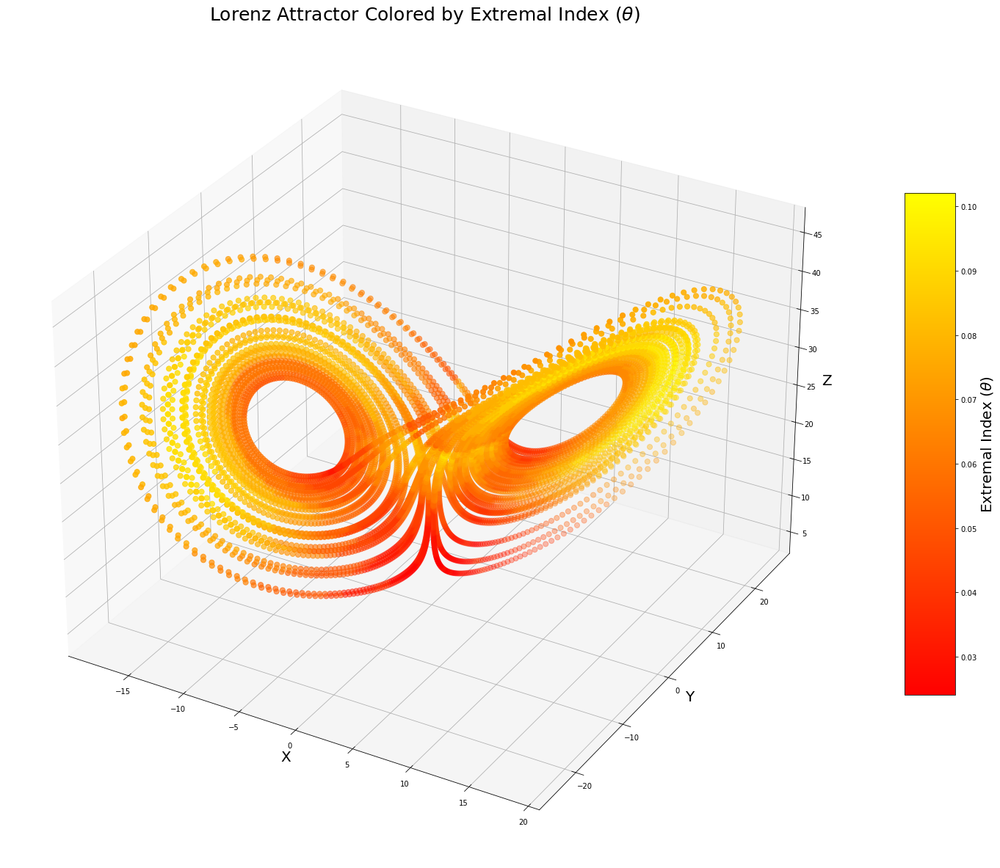

In [672]:
fig = plt.figure(figsize=(30, 21))
ax  = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(x, y, z, c=theta, cmap='autumn', s=50)  
#colorbar to show the mapping of colors to Theta values
cbar = plt.colorbar(scatter, ax=ax, shrink=0.6, aspect=10)
cbar.set_label("Extremal Index ($\\theta$)", fontsize=20)
ax.set_title("Lorenz Attractor Colored by Extremal Index ($\\theta$)", fontsize=25)
ax.set_xlabel("X", fontsize=20)
ax.set_ylabel("Y", fontsize=20)
ax.set_zlabel("Z", fontsize=20)

plt.show()

In [17]:
save_dir = "/Users/elliotlowe/Computational_Geosciences "

In [673]:
# Define save directory and filename
save_dir = "/Users/elliotlowe/Computational_Geosciences"
save_path = os.path.abspath(os.path.join(save_dir, "Lorenz_EI_Colored.png"))
fig.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [520]:
minthetavalue = min(theta)
idx_mintheta  = np.argmin(theta)
print(f"Minimum theta value is {minthetavalue} which occours at {round(t[idx_mintheta],2)} seconds")

#KDTree for fast nearest-neighbor search
tree_nnsearch = KDTree(X)
k = 100
_,indices_nnsearch = tree_nnsearch.query(X[idx_mintheta],k)
X_nn     = X[indices_nnsearch]
theta_nn = theta[indices_nnsearch]
X_theta  = X[idx_mintheta]

Minimum theta value is 0.023650093722869657 which occours at 34.87 seconds


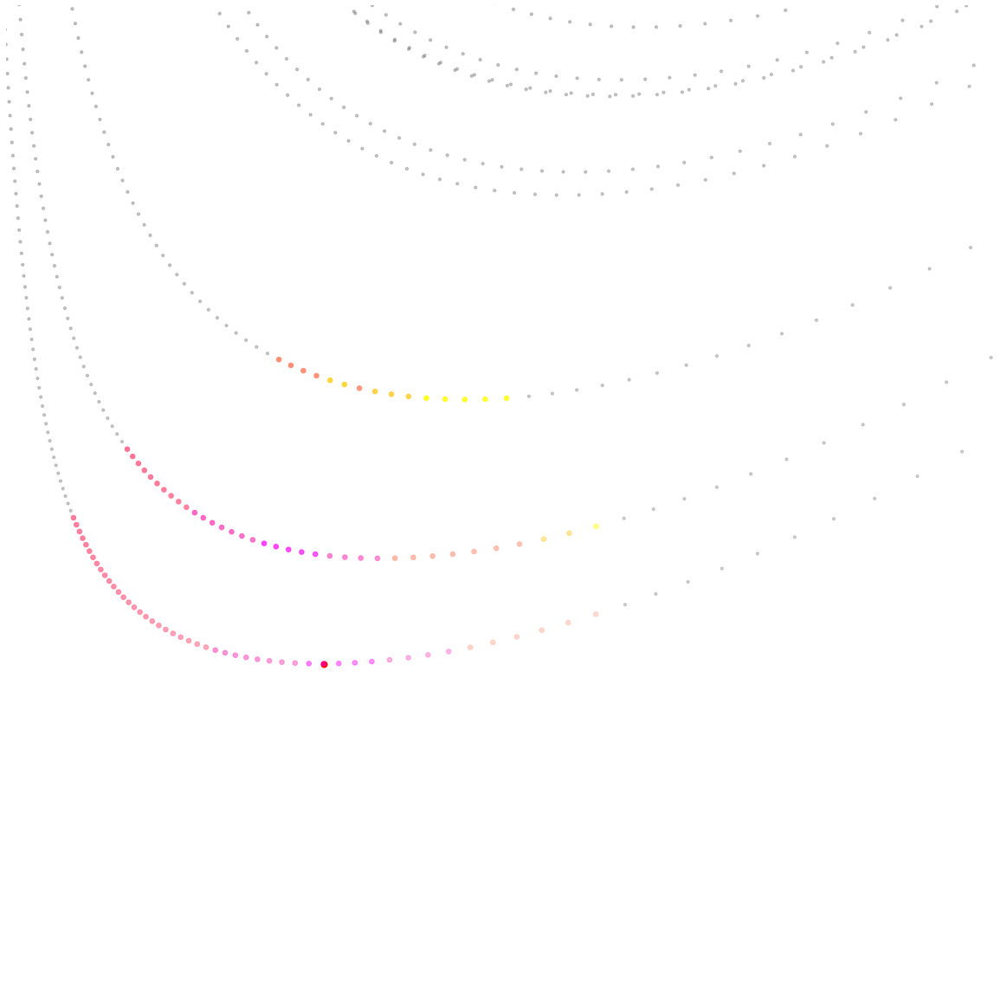

In [535]:
filtered_X     = np.delete(X, indices_nnsearch,axis=0)
filtered_theta = np.delete(theta, indices_nnsearch)
x_nn,y_nn,z_nn = X_nn[:,0],X_nn[:,1],X_nn[:,2]
x_f, y_f, z_f  = filtered_X[:,0],filtered_X[:,1],filtered_X[:,2]
x_m, y_m, z_m  = x[idx_mintheta],y[idx_mintheta],z[idx_mintheta]

fig_nnsearch = plt.figure(figsize=(30, 21))
ax           = fig_nnsearch.add_subplot(111, projection='3d')
scatter1     = ax.scatter(x_nn, y_nn, z_nn, c=theta_nn, cmap='spring', s=30)  
scatter0     = ax.scatter(x_f, y_f, z_f, color='dimgrey', s=10)
scatter2     = ax.scatter(x_m, y_m, z_m, color='red', s=50)
#cbar         = plt.colorbar(scatter, ax=ax, shrink=0.6, aspect=10)
ax.set_axis_off()

#zooming
ax.set_xlim(2.5, 7.5)  
ax.set_ylim(-5, 5)  
ax.set_zlim(7.5, 12.5) 

plt.show()

In [536]:
def calculate_speed(state):
    x, y, z = state[:,0],state[:,1],state[:,2]  
    dxdt = sigma * (y - x)
    dydt = x * (rho - z) - y
    dzdt = x * y - beta * z
    speed = np.sqrt(dxdt**2 + dydt**2 + dzdt**2)
    return speed

speed = calculate_speed(X)

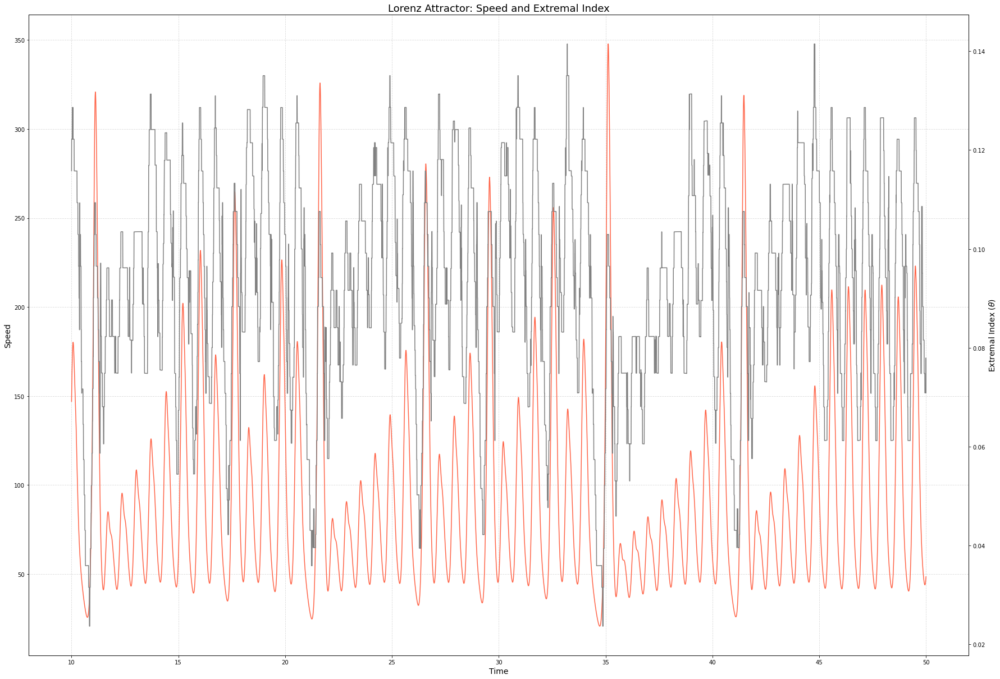

In [544]:
fig_speed = plt.figure(figsize=(30, 21))
ax1 = fig_speed.add_subplot(111)

# Primary y-axis (Speed)
ax1.plot(t, speed, c='tomato', label="Speed")  
ax1.set_xlabel("Time", fontsize=14)
ax1.set_ylabel("Speed", fontsize=14, color='black')
ax1.tick_params(axis='y', labelcolor='black')

# Secondary y-axis (Extremal Index Theta)
ax2 = ax1.twinx()  # Create a twin y-axis
ax2.plot(t, theta, c='grey', label="Extremal Index ($\\theta$)")  
ax2.set_ylabel("Extremal Index ($\\theta$)", fontsize=14, color='black')
ax2.tick_params(axis='y', labelcolor='black')

# Title and grid
ax1.set_title("Lorenz Attractor: Speed and Extremal Index", fontsize=18)
ax1.grid(True, which='both', linestyle='--', alpha=0.5)  # Optional: Add a grid

plt.show()

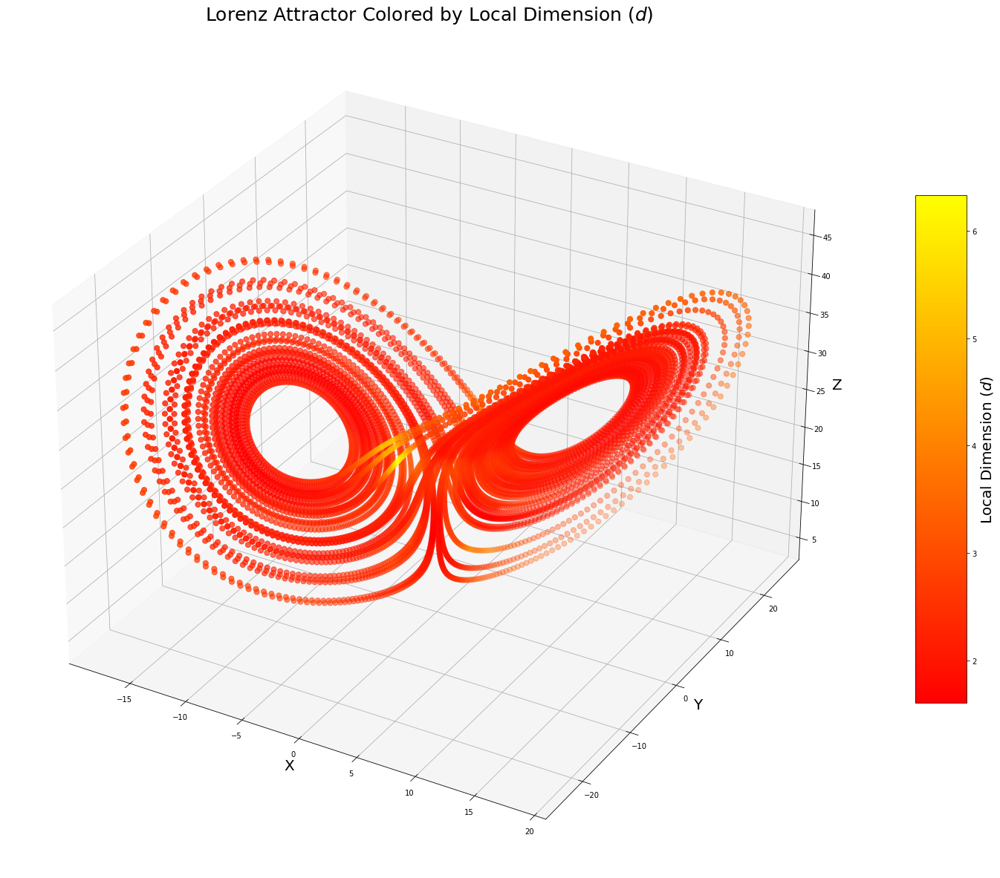

In [670]:
fig2    = plt.figure(figsize=(30, 21))
ax2     = fig2.add_subplot(111, projection='3d')
scatter = ax2.scatter(x, y, z, c=d1, cmap='autumn', s=50)  
cbar    = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Local Dimension ($d$)", fontsize=20)
ax2.set_title("Lorenz Attractor Colored by Local Dimension ($d$)", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)

plt.show()

In [681]:
average_d = np.mean(d1)
max_d     = max(d1)
print(f"Average Dimension {average_d}")
print(f"Max Dimension {max_d}")

Average Dimension 2.2070985824935407
Max Dimension 6.334507202169086


In [671]:
# Define save directory and filename
save_path = os.path.abspath(os.path.join(save_dir, "Lorenz_D1_Colored.png"))
fig2.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

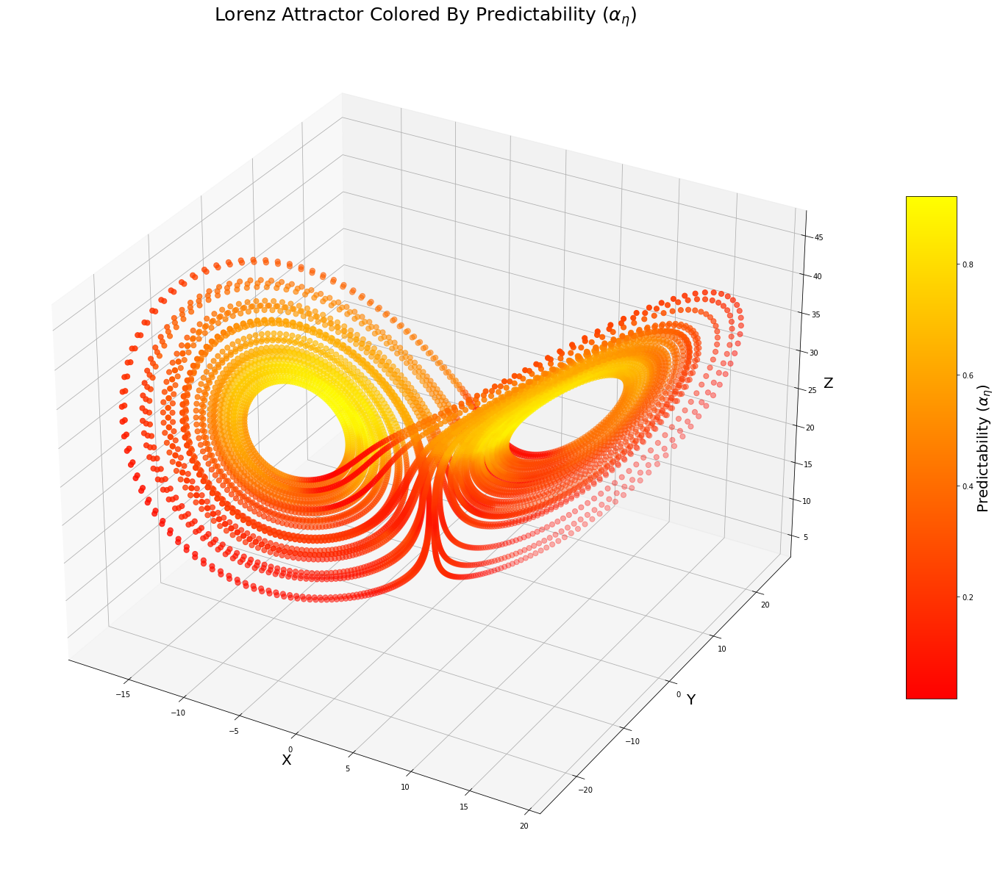

In [668]:
fig_alpha    = plt.figure(figsize=(30, 21))
ax2     = fig_alpha.add_subplot(111, projection='3d')
scatter = ax2.scatter(x[44:], y[44:], z[44:], c=allie[44], cmap='autumn', s=50)  
cbar    = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("Lorenz Attractor Colored By Predictability ($\\alpha_{\\eta}$)", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)

plt.show()

In [669]:
save_path = os.path.abspath(os.path.join(save_dir, "Lorenz_ALPHA_Colored.png"))
fig_alpha.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

Shapes: (7956,) (7956,) (7956,)


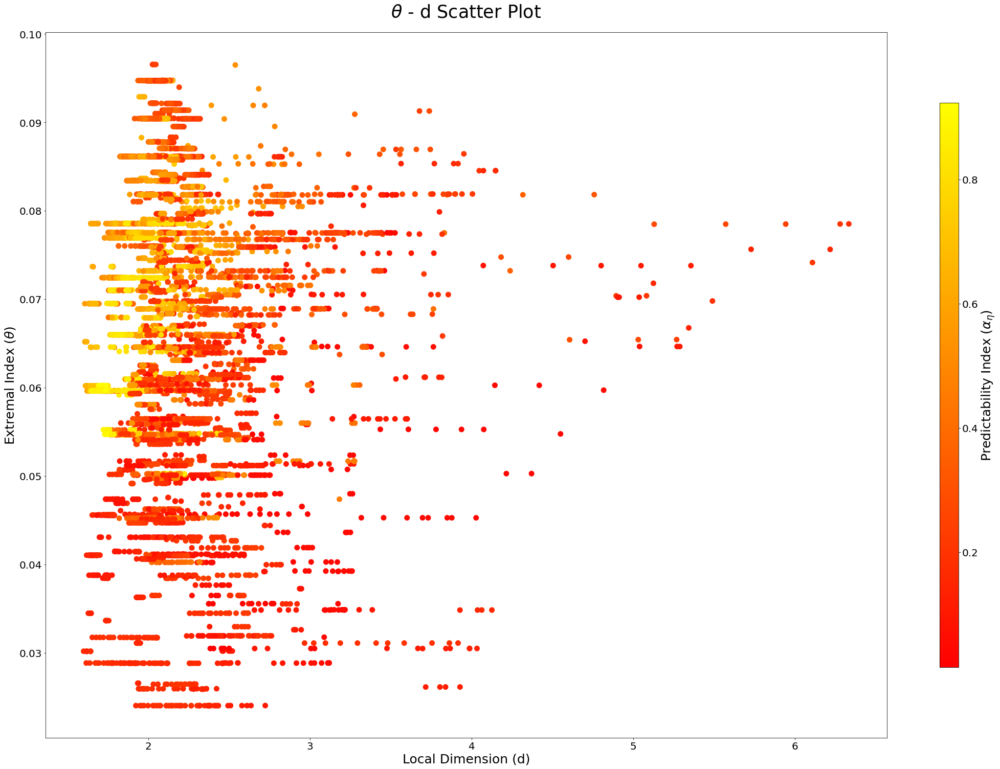

In [677]:
theta_trimmed = theta[44:]
d_trimmed     = d1[44:]

color_vals = np.ravel(allie[44])
print("Shapes:", d_trimmed.shape, theta_trimmed.shape, color_vals.shape)

fig_dta = plt.figure(figsize=(30, 21))
ax = fig_dta.add_subplot(111)

scatter = ax.scatter(d_trimmed, theta_trimmed, c=color_vals, cmap='autumn',
                     vmin=np.min(color_vals), vmax=np.max(color_vals), s= 100)

cbar = plt.colorbar(scatter, ax=ax, shrink=0.8, aspect=30)
cbar.set_label("Predictability Index ($\\alpha_{\\eta}$)", fontsize=25)
cbar.ax.tick_params(labelsize=20)

ax.set_xlabel("Local Dimension (d)", fontsize=25)
ax.set_ylabel("Extremal Index ($\\theta$)", fontsize=25)
ax.set_title("$\\theta$ - d Scatter Plot", fontsize=35, pad=30)
ax.tick_params(axis='both', which='major', labelsize=20)

plt.tight_layout()
plt.show()

In [678]:
save_path = os.path.abspath(os.path.join(save_dir, "Lorenz_d_theta_alpha.png"))
fig_dta.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

Text(0.5, 1.0, 'Z Position Timeseries')

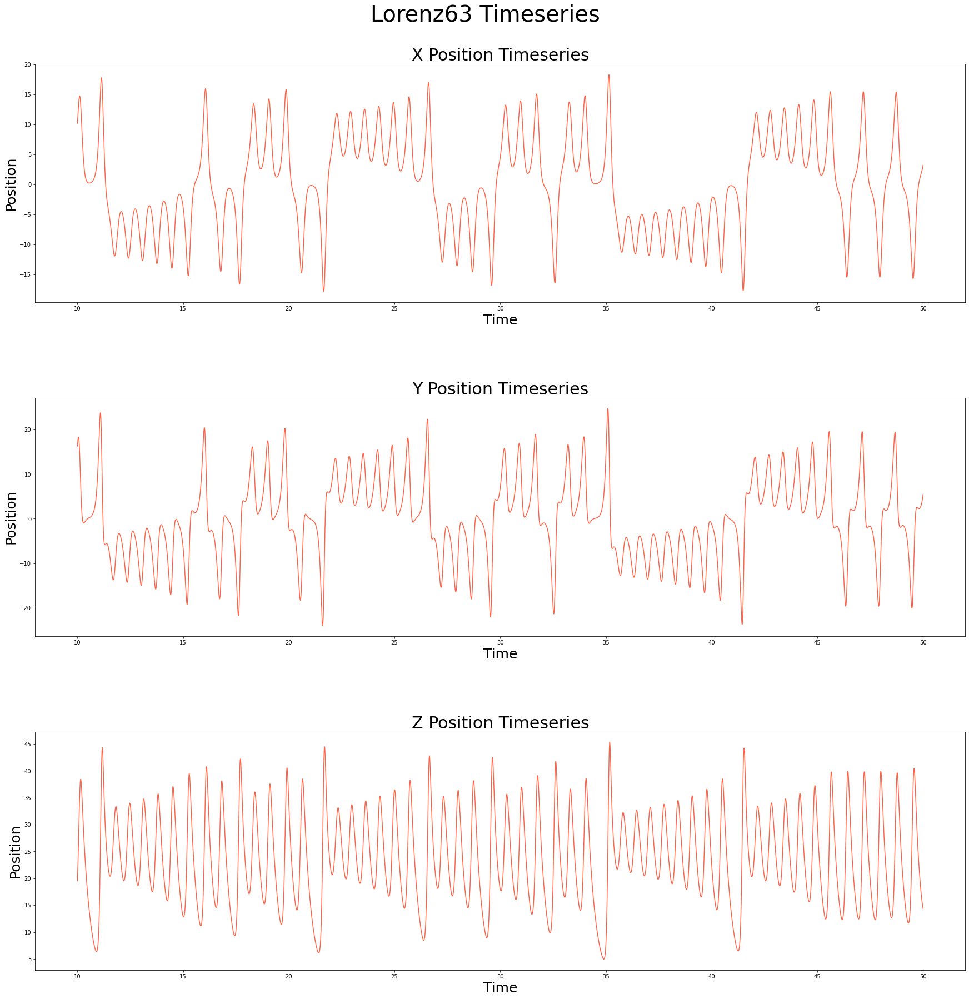

In [6]:
fig3 = plt.figure(figsize = (30,30))

fig3.subplots_adjust(hspace=0.4)

fig3.suptitle("Lorenz63 Timeseries", fontsize=40, y=0.93)

ax2 = fig3.add_subplot(3,1,1)
ax2.plot(t,x,color="tomato")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"X Position Timeseries", fontsize = 30)

ax2 = fig3.add_subplot(3,1,2)
ax2.plot(t,y,color="tomato")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"Y Position Timeseries", fontsize = 30)

ax2 = fig3.add_subplot(3,1,3)
ax2.plot(t,z,color="tomato")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"Z Position Timeseries", fontsize = 30)

### 2. Forecasting the Time Series

To estimate the metric entropy I first need an algorithm to forecast future values of the time series. In
particular, I need to estimate the correlation coefficient between the true value and the forecasted value.
I will first try a nearest-neighbors forecasting scheme..

1. Split the data into a training set (50%) and a test set (50%).
2. For a given time '$t_{now}$' in the test set, find the k nearest neighbours (e.g., k = 10) in the phase space in the training set.
3. Average the motion of these nearest neighbours evolved some time '$t_{forecast}$' into the future.
4. Assume that the trajectory at '$t_{now}$' will evolve in the same way as the average value calculated in the previous step.
5. For each variable, estimate the correlation coefficient between the forecasted value and the true value.

Now need to estimate the metric entropy, h, associated with the Lorenz system. h may be estimated using the algorithm below. We use this algorithm to make forecasts at different $t_{fc}$, calculate the Pearson’s correlation coefficient for each tested forecasting horizon time, and estimate h from how quickly the forecast degrades. In fact, we expect r to decrease with increasing forecasting horizon, and taking the slope of the best fitting line is equivalent to looking at how quickly the forecast gets worse.

$$ ln(1-r(t_{fc})) = ln\left(\frac{s^{2}_{0}}{2\sigma^{2}_{\overrightarrow{x}}}\right) + 2ht_{fc}$$

<br>


$$ \textbf{y} = ln(1-r(t_{fc}))  \longrightarrow   \textbf{x} = t_{fc}  \longrightarrow    \textbf{c} = ln\left(\frac{s^{2}_{0}}{2\sigma^{2}_{\overrightarrow{x}}}\right) $$

<br>


$$ \textbf{y} = 2h\textbf{x} + \textbf{c} $$

In [76]:
# Define the split ratio
split_ratio = 0.5     # 50% training, 50% testing
num_points  = len(t)  # Total number of points

# Generate a random permutation of indices
indices = np.random.permutation(num_points)

# Select the first half for training and the second half for testing
split_idx = int(split_ratio * num_points)
train_indices, test_indices = indices[:split_idx], indices[split_idx:]

#scale data using z-score normalisation
from sklearn.preprocessing import StandardScaler
scaler   = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Use these indices to split both X (positions) and t (time)
train_data, test_data = X_scaled[train_indices], X_scaled[test_indices]
train_time, test_time = t[train_indices], t[test_indices]

#Sort data in correct order
sorted_indices = np.argsort(test_time) #test
test_time      = test_time[sorted_indices]
test_data      = test_data[sorted_indices]
sorted_indices = np.argsort(train_time) #train
train_time     = train_time[sorted_indices]
train_data     = train_data[sorted_indices]

In [77]:
def IndiceFinder(L_array,S_array):
    """Finds the indice in L_array for which the values in S_array occour then finds how many indices ahead 
        of idx they are"""
    indices = []
    #S_array could be a single value
    if isinstance(S_array, np.ndarray):
        for val in S_array:
            index = np.argmin(np.abs(L_array - val))
            indices.append(index)
        indices = np.array(indices)
    else:
        val = S_array
        indices = np.argmin(np.abs(L_array - val))
    return indices

In [78]:
#KDTree for fast nearest-neighbor search
tree = KDTree(train_data)

#Forecasting parameter
k = 10 
max_forecast = 1.1 #Lyapunov Time
adding_times = np.linspace(0.1, max_forecast, 100)

#current parameters
current_times   = np.random.choice(test_time, size=70, replace=False)
current_indices = IndiceFinder(test_time,current_times)

#array setup
Yarrays = []
Xarrays = []
Forecasted_vals = []
STD_DEV_VALS    = []

In [79]:
#loop time
for i, Tnow in tqdm(enumerate(current_times), total=len(current_times), desc="Forecasting"):
        
    #1. find a suitable forecast time and their corresponding indices
    if Tnow < 48.0:
        Forecast_times   = adding_times + Tnow
        Forecast_indices = IndiceFinder(test_time, Forecast_times)
        idx_Tnow = current_indices[i] 

    else:
        Tnow -= 2
        Forecast_times   = adding_times + Tnow
        Forecast_indices = IndiceFinder(test_time, Forecast_times)
        idx_Tnow = IndiceFinder(test_time,Tnow)
    
    #2. Find the Lorenz datapoint at Tnow
    Xnow = test_data[idx_Tnow]
    
    #3. Find the nearest neighbours to this point in the training set
    distances, indices = tree.query(Xnow, k=k)
    Tmax    = 48
    idx_45  = IndiceFinder(train_time,Tmax)
    mask    = indices < idx_45
    indices = indices[mask]
    
    #4. Empty arrays to store equation components
    Y                = []
    Forecasted_value = []
    STD_DEV_ERRORS   = []

    #5. Loop over each forecast time and make predictions
    for i, idx_tforecast in enumerate(Forecast_indices):
        future_trajectory = []
        difference = idx_tforecast - idx_Tnow
        if isinstance(difference, np.ndarray):
            print(f"Difference is an array not a scaler. Tnow = {Tnow}, at index {idx_Tnow}")
        for idx_next in range(1,difference+1):
            next_indices   = indices + idx_next
            NN_positions   = train_data[next_indices]
            next_position  = np.mean(NN_positions,axis=0)
            future_trajectory.append(next_position)
        
        #6. Find true trajectories, error values, and standard deviations.
        Forecast_trajectory = np.array(future_trajectory)
        Forecasted_value.append(Forecast_trajectory[-1])
        True_trajectory     = test_data[idx_Tnow:idx_Tnow + difference]
        trajectory_errors   = np.linalg.norm(True_trajectory - Forecast_trajectory, axis=1)
        Std_dev_errors      = np.std(trajectory_errors)
        STD_DEV_ERRORS.append(Std_dev_errors)
        
        #7. Find Y side of equation
        corr_x, _ = pearsonr(True_trajectory[:, 0], Forecast_trajectory[:, 0])
        corr_y, _ = pearsonr(True_trajectory[:, 1], Forecast_trajectory[:, 1])
        corr_z, _ = pearsonr(True_trajectory[:, 2], Forecast_trajectory[:, 2])
        corr_coefficient = np.mean([corr_x, corr_y, corr_z])
        Yside = np.log(1-corr_coefficient)
        Y.append(Yside)
    
    #8. append all values for access 
    Y                = np.array(Y)
    STD_DEV_ERRORS   = np.array(STD_DEV_ERRORS)
    Forecasted_value = np.array(Forecasted_value)
    
    Yarrays.append(Y)
    Xarrays.append(Forecast_times)
    STD_DEV_VALS.append(STD_DEV_ERRORS)
    Forecasted_vals.append(Forecasted_value)

Yarrays = np.array(Yarrays)
Xarrays = np.array(Xarrays)
STD_DEV_VALS    = np.array(STD_DEV_VALS)
Forecasted_vals = np.array(Forecasted_vals)

Forecasting: 100%|██████████| 70/70 [00:26<00:00,  2.64it/s]


In [80]:
from scipy.optimize import curve_fit
def linear_model(x, m, c):
    return m * x + c

entropies = []
C_vals    = []
x         = adding_times
for i in range(len(current_times)):
    y    = Yarrays[i]
    params, covariance = curve_fit(linear_model, x, y)
    m_best, c_best     = params
    h = m_best/2
    entropies.append(h)
    C_vals.append(c_best)
    
entropies       = np.array(entropies)
average_entropy = np.mean(entropies)
C_vals          = np.array(C_vals)
average_C_val   = np.mean(C_vals)

entropy is 0.45800766178749047


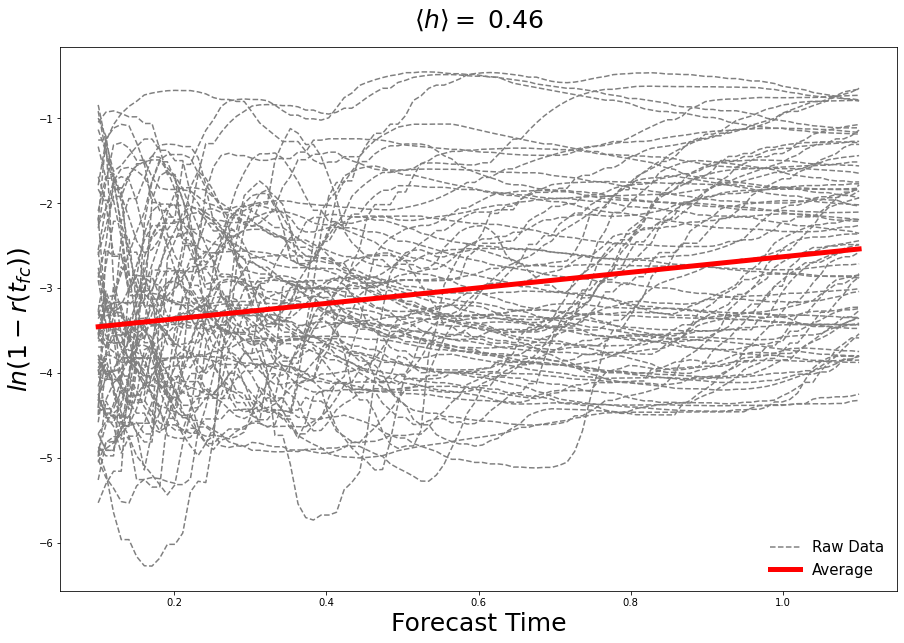

In [83]:
fig0 = plt.figure(figsize = (15,10))
ax2  = fig0.add_subplot(1,1,1)
newx = adding_times
for i in range(len(current_times)):
    y = Yarrays[i]
    if i == 0:
        ax2.plot(newx, y, color='grey', label="Raw Data",linestyle="--")
    else:
        ax2.plot(newx, y, color='grey',linestyle="--")
yfit = linear_model(newx,2*average_entropy,average_C_val)
ax2.plot(newx, yfit, color='red',linewidth=5,label="Average")
ax2.set_xlabel("Forecast Time", fontsize = 25)
ax2.set_ylabel("$ln(1-r(t_{fc}))$", fontsize = 25)
ax2.set_title("$\\left\\langle h \\right\\rangle = $ 0.46", fontsize = 25, pad = 20)
ax2.legend(fontsize=15,frameon=False)
print(f"entropy is {average_entropy}")

In [84]:
save_path = os.path.abspath(os.path.join(save_dir, "Forecasting_Plot_One.png"))
fig0.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [41]:
LT = 1.1
Times_Display = np.array([0.01,0.05,0.2,1,2])*LT
time_lag = []
for t in Times_Display:
    idx = int(round(((t)/dt),0))
    time_lag.append(idx)
time_lag = np.array(time_lag)   

In [36]:
x,y,z = X[:,0],X[:,1],X[:,2]

In [42]:
filename = "initial_state[1.4324_2.6837_18.5043]_Forecasting_Alphas"

alphas_ent = compute_alphat(dist, exceeds_bool, filepath, filename, time_lag, ql, theiler_len, l=1)

100%|██████████| 5/5 [00:10<00:00,  2.03s/it]


In [43]:
#ONE
TL        = Times_Display[0]
TL_idx    = time_lag[0]
alpha     = alphas_ent[TL_idx]
avg_alpha = np.mean(alpha)
print(f"Average value = {avg_alpha}, time forecast = {TL}")

Average value = 0.9613029558325052, time forecast = 0.011000000000000001


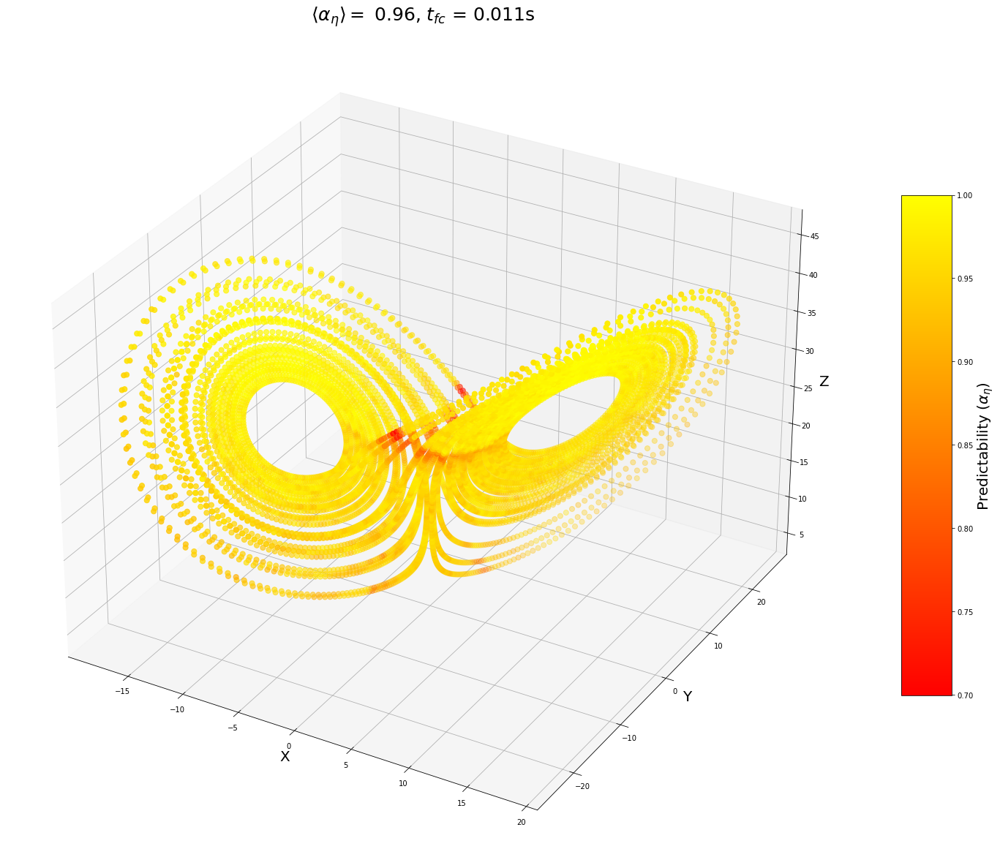

In [47]:
fig_alpha_one = plt.figure(figsize=(30, 21))
ax2           = fig_alpha_one.add_subplot(111, projection='3d')
scatter       = ax2.scatter(x[TL_idx:], y[TL_idx:], z[TL_idx:], c=alpha, cmap='autumn', s=50)  
cbar          = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("$\\left\\langle \\alpha_{\\eta} \\right\\rangle =$ 0.96, $t_{fc}$ = 0.011s", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)
plt.show()

In [48]:
save_path = os.path.abspath(os.path.join(save_dir, "Forecasting_T0.011.png"))
fig_alpha_one.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [49]:
#TWO
TL        = Times_Display[1]
TL_idx    = time_lag[1]
alpha     = alphas_ent[TL_idx]
avg_alpha = np.mean(alpha)
print(f"Average value = {avg_alpha}, time forecast = {TL}")

Average value = 0.7899300953705023, time forecast = 0.05500000000000001


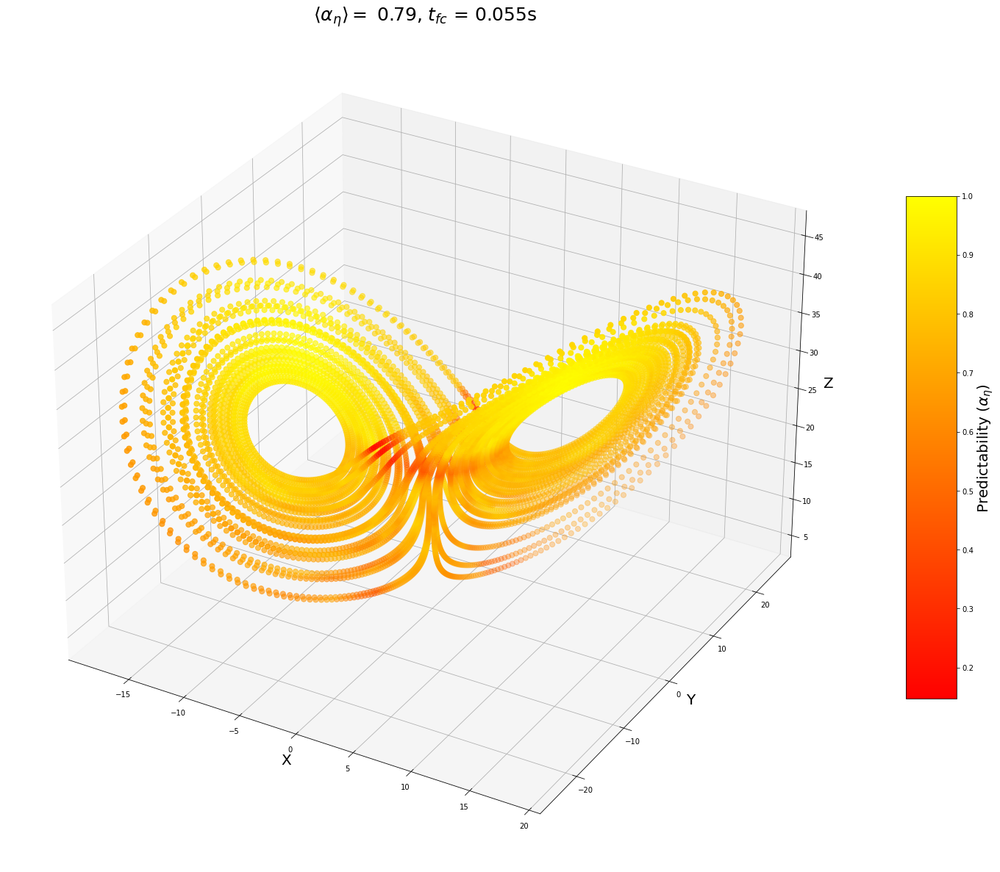

In [50]:
fig_alpha_two = plt.figure(figsize=(30, 21))
ax2           = fig_alpha_two.add_subplot(111, projection='3d')
scatter       = ax2.scatter(x[TL_idx:], y[TL_idx:], z[TL_idx:], c=alpha, cmap='autumn', s=50)  
cbar          = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("$\\left\\langle \\alpha_{\\eta} \\right\\rangle =$ 0.79, $t_{fc}$ = 0.055s", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)
plt.show()

In [55]:
save_path = os.path.abspath(os.path.join(save_dir, "Forecasting_T0.055.png"))
fig_alpha_two.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [52]:
#THREE
TL        = Times_Display[2]
TL_idx    = time_lag[2]
alpha     = alphas_ent[TL_idx]
avg_alpha = np.mean(alpha)
print(f"Average value = {avg_alpha}, time forecast = {TL}")

Average value = 0.3986653077286805, time forecast = 0.22000000000000003


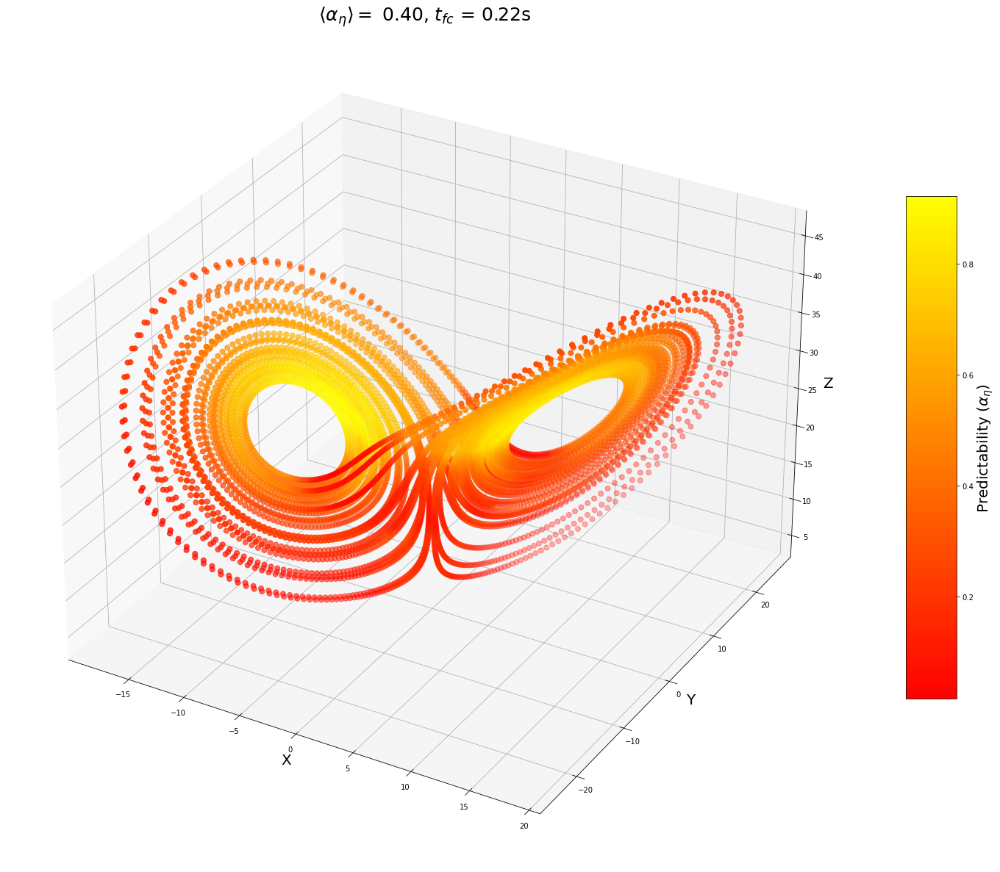

In [53]:
fig_alpha_three = plt.figure(figsize=(30, 21))
ax2             = fig_alpha_three.add_subplot(111, projection='3d')
scatter         = ax2.scatter(x[TL_idx:], y[TL_idx:], z[TL_idx:], c=alpha, cmap='autumn', s=50)  
cbar            = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("$\\left\\langle \\alpha_{\\eta} \\right\\rangle =$ 0.40, $t_{fc}$ = 0.22s", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)
plt.show()

In [56]:
save_path = os.path.abspath(os.path.join(save_dir, "Forecasting_T0.22.png"))
fig_alpha_three.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [57]:
#FOUR
TL        = Times_Display[3]
TL_idx    = time_lag[3]
alpha     = alphas_ent[TL_idx]
avg_alpha = np.mean(alpha)
print(f"Average value = {avg_alpha}, time forecast = {TL}")

Average value = 0.07437781409881676, time forecast = 1.1


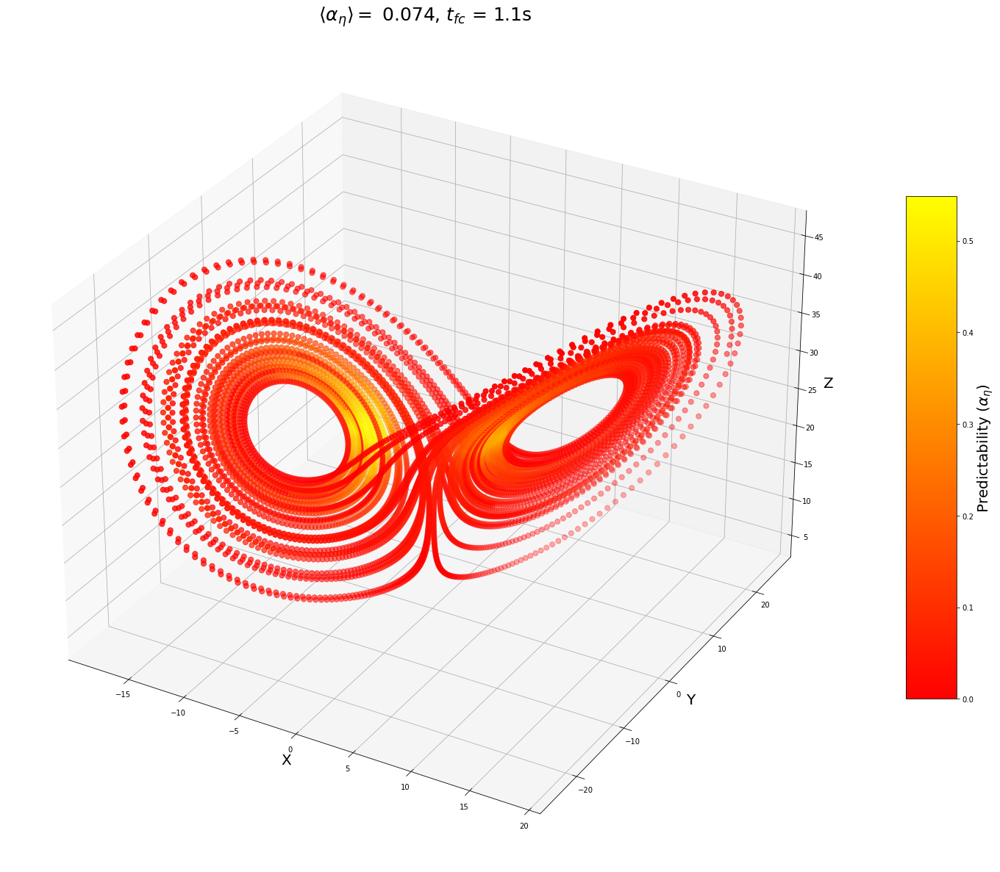

In [58]:
fig_alpha_four  = plt.figure(figsize=(30, 21))
ax2             = fig_alpha_four.add_subplot(111, projection='3d')
scatter         = ax2.scatter(x[TL_idx:], y[TL_idx:], z[TL_idx:], c=alpha, cmap='autumn', s=50)  
cbar            = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("$\\left\\langle \\alpha_{\\eta} \\right\\rangle =$ 0.074, $t_{fc}$ = 1.1s", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)
plt.show()

In [59]:
save_path = os.path.abspath(os.path.join(save_dir, "Forecasting_T1.1.png"))
fig_alpha_four.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [60]:
from scipy.stats import gaussian_kde
x_vals = np.linspace(0, 1, 500)
alpha_distribution = {}
for idx in range(len(time_lag)):
    TL_idx    = time_lag[idx]
    alpha     = alphas_ent[TL_idx]
    kde       = gaussian_kde(alpha)
    pdf_vals  = kde(x_vals)
    alpha_distribution[idx] = pdf_vals  

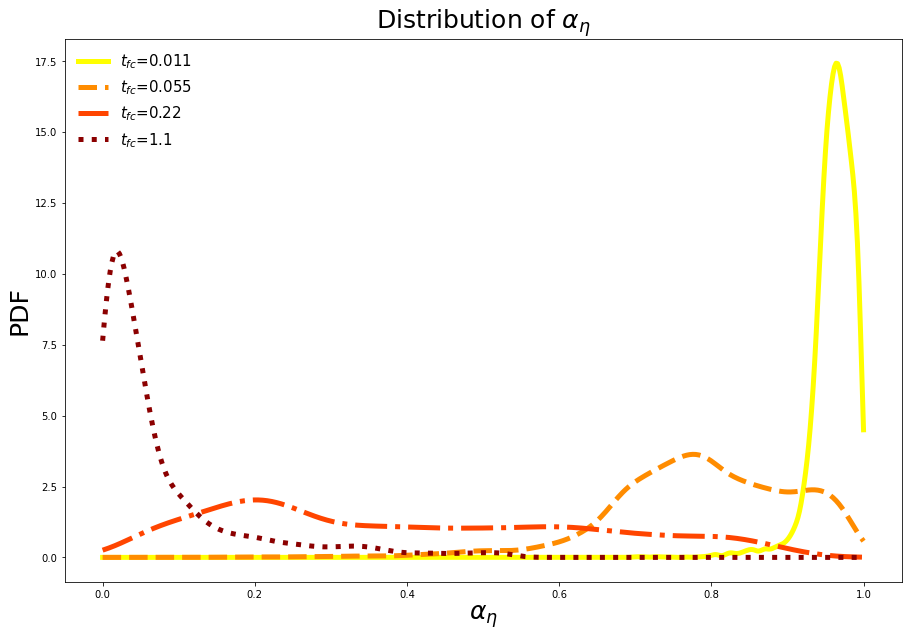

In [66]:
fig_PDE = plt.figure(figsize = (15,10))
ax2     = fig_PDE.add_subplot(1,1,1)

ax2.plot(x_vals, alpha_distribution[0],label="$t_{fc}$=0.011",linewidth=5,color='yellow')
ax2.plot(x_vals, alpha_distribution[1],label="$t_{fc}$=0.055",linewidth=5,color='darkorange',linestyle="--")
ax2.plot(x_vals, alpha_distribution[2],label="$t_{fc}$=0.22" ,linewidth=5,color='orangered',linestyle="-.")
ax2.plot(x_vals, alpha_distribution[3],label="$t_{fc}$=1.1"  ,linewidth=5,color='darkred',linestyle=":")

ax2.set_xlabel("$\\alpha_{\\eta}$", fontsize = 25)
ax2.set_ylabel("PDF", fontsize = 25)
ax2.set_title("Distribution of $\\alpha_{\\eta}$", fontsize = 25)
ax2.legend(fontsize=15, frameon=False)

In [67]:
save_path = os.path.abspath(os.path.join(save_dir, "PDF_Forecasting.png"))
fig_PDE.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

## 3. Entropy As A Function of S.D

In [138]:
def error_distribution(error, stdev):
    Const    = 1 / (np.sqrt(2 * np.pi) * stdev)  # Prefactor
    exponent = - (error ** 2) / (2 * stdev ** 2)  # Fix negative sign in exponent
    return Const * np.exp(exponent)  # Compute PDF

Text(0.5, 1.0, 'Probability Distribution of Errors In Forecasting')

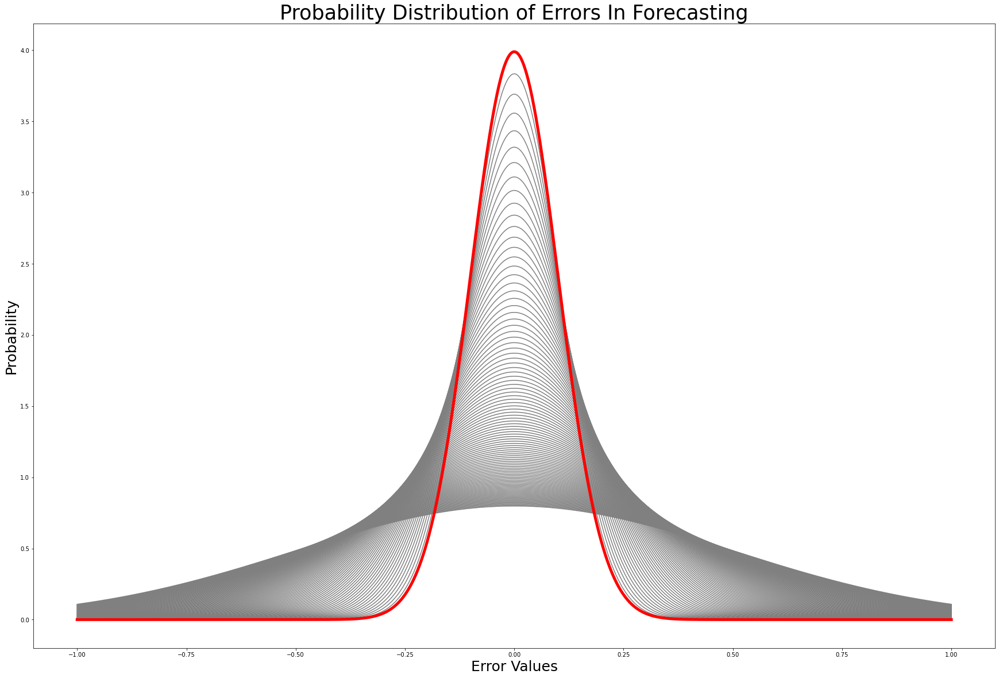

In [148]:
error_pe = np.linspace(-1,1,10000)
pe       = error_distribution(error_pe,stdev=0.1)
sigvals  = np.linspace(0.1,0.5,100)

figerror = plt.figure(figsize = (30,20))
ax2  = figerror.add_subplot(1,1,1)
ax2.plot(error_pe, pe, color='red', zorder=10, linewidth=5)
for i in range(len(sigvals)):
    sig = sigvals[i]
    pe  = error_distribution(error_pe,sig)
    if i == 0:
        ax2.plot(error_pe, pe, color='grey', label="Other Distributions", zorder=5)
    else:
        ax2.plot(error_pe, pe, color='grey', zorder=5)
ax2.set_xlabel("Error Values", fontsize = 25)
ax2.set_ylabel("Probability", fontsize = 25)
ax2.set_title(f"Probability Distribution of Errors In Forecasting", fontsize = 35)
ax2.legend(fontsize=25)

In [127]:
def add_noise(X, sig):
    """Adds Gaussian noise with standard deviation 'sig' to a 3D position array X."""    
    noise = np.random.normal(loc=0, scale=sig, size=X.shape)
    X_noisy = X + noise  
    return X_noisy

In [139]:
h = []
sigvals = np.logspace(-3, -0.2, 50)  

#Looping over each simg value 
for SIG in tqdm(sigvals, total=len(sigvals), desc="Entropy Calculations at each Noise level"):
    
    Yarrays = []
    test_data_N = add_noise(test_data,SIG)

    #loop time
    for i, Tnow in enumerate(current_times):

        #1. find a suitable forecast time and their corresponding indices
        if Tnow < 48.0:
            Forecast_times   = adding_times + Tnow
            Forecast_indices = IndiceFinder(test_time, Forecast_times)
            idx_Tnow = current_indices[i] 

        else:
            Tnow -= 2
            Forecast_times   = adding_times + Tnow
            Forecast_indices = IndiceFinder(test_time, Forecast_times)
            idx_Tnow = IndiceFinder(test_time,Tnow)

        #2. Find the Lorenz datapoint at Tnow
        Xnow = test_data_N[idx_Tnow]

        #3. Find the nearest neighbours to this point in the training set
        distances, indices = tree.query(Xnow, k=k)
        Tmax    = 48
        idx_45  = IndiceFinder(train_time,Tmax)
        mask    = indices < idx_45
        indices = indices[mask]

        #4. Empty arrays to store equation components
        Y                = []

        #5. Loop over each forecast time and make predictions
        for i, idx_tforecast in enumerate(Forecast_indices):
            future_trajectory = []
            difference = idx_tforecast - idx_Tnow
            if isinstance(difference, np.ndarray):
                print(f"Difference is an array not a scaler. Tnow = {Tnow}, at index {idx_Tnow}")
            for idx_next in range(1,difference+1):
                next_indices   = indices + idx_next
                NN_positions   = train_data[next_indices]
                next_position  = np.mean(NN_positions,axis=0)
                future_trajectory.append(next_position)

            #6. Find true trajectories, error values, and standard deviations.
            Forecast_trajectory = np.array(future_trajectory)
            True_trajectory     = test_data[idx_Tnow:idx_Tnow + difference]

            # 7. Check for NaNs or Infs in the true and forecast trajectories
            if np.any(np.isnan(True_trajectory)) or np.any(np.isinf(True_trajectory)):
                print(f"Skipping Pearson calculation due to NaNs/Infs in True_trajectory at SIG = {SIG}, index {i}")
                break  # Skip this loop and continue to the next SIG value
            
            if np.any(np.isnan(Forecast_trajectory)) or np.any(np.isinf(Forecast_trajectory)):
                print(f"Skipping Pearson calculation due to NaNs/Infs in Forecast_trajectory at SIG = {SIG}, index {i}")
                break  # Skip this loop and continue to the next SIG value

            # 8. Find Y side of equation
            corr_x, _ = pearsonr(True_trajectory[:, 0], Forecast_trajectory[:, 0])
            corr_y, _ = pearsonr(True_trajectory[:, 1], Forecast_trajectory[:, 1])
            corr_z, _ = pearsonr(True_trajectory[:, 2], Forecast_trajectory[:, 2])
            corr_coefficient = np.mean([corr_x, corr_y, corr_z])
            Yside = np.log(1 - corr_coefficient)
            Y.append(Yside)
            
        # If there was a break due to NaNs/Infs, continue to the next SIG value
        if np.any(np.isnan(True_trajectory)) or np.any(np.isinf(True_trajectory)) or np.any(np.isnan(Forecast_trajectory)) or np.any(np.isinf(Forecast_trajectory)):
            continue  # Skip the rest of the current SIG value and proceed with the next SIG value

        #8. append all values for access 
        Y = np.array(Y)
        Yarrays.append(Y)

    Yarrays = np.array(Yarrays)
    entropies = []
    for i in range(len(Yarrays)):
        y    = Yarrays[i]
        params, covariance = curve_fit(linear_model, adding_times, y)
        m_best, c_best     = params
        ent = m_best/2
        entropies.append(ent)

    entropies       = np.array(entropies)
    average_entropy = np.mean(entropies)
    h.append(average_entropy)
    
h = np.array(h)

Entropy Calculations at each Noise level: 100%|██████████| 50/50 [15:44<00:00, 18.89s/it]


Text(0.5, 1.0, "Effect of Noise on Lorenz'63 Entropy")

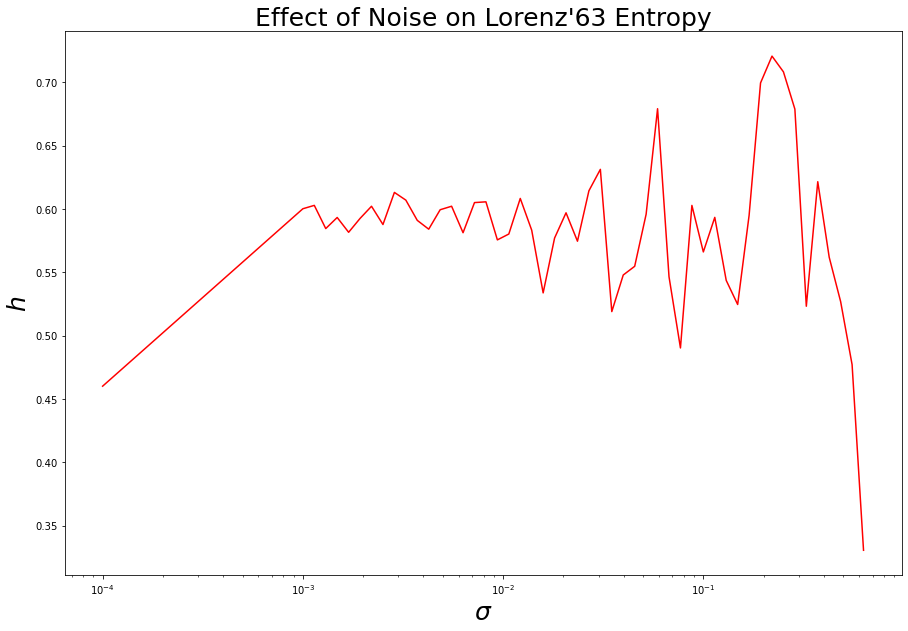

In [162]:
from scipy import stats
from scipy.interpolate import CubicSpline

x = sigvals
y = h
x = np.insert(x, 0, 0.0001)
y = np.insert(y, 0, 0.46)

num_bins = 25  # Adjust as needed
bin_means, bin_edges, _ = stats.binned_statistic(x, y, statistic='mean', bins=num_bins)
valid = np.isfinite(bin_means)
bin_means = bin_means[valid]
bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
bin_centers = bin_centers[valid]
spline = CubicSpline(bin_centers, bin_means)
newx = np.linspace(min(x),max(x),10000)
newy = spline(newx)

figerror = plt.figure(figsize = (15,10))
ax2      = figerror.add_subplot(1,1,1)
ax2.plot(x, y, color='red')
#ax2.plot(newx, newy, color='red',label='Fit')
ax2.set_xscale('log')
ax2.set_xlabel("$\\sigma$", fontsize = 25)
ax2.set_ylabel("$h$", fontsize = 25)
ax2.set_title(f"Effect of Noise on Lorenz'63 Entropy", fontsize = 25)
#ax2.legend(fontsize=15, frameon=False)

In [163]:
save_path = os.path.abspath(os.path.join(save_dir, "Noise_Entropy.png"))
figerror.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

## 5. Sensitivity to Initial Conditions

In [167]:
initial_state = [1.4324, 2.6837, 18.5043]

t_u = np.linspace(0, 50, 10000)
solution_u  = solve_ivp(lorenz, [t_u[0], t_u[-1]], initial_state, t_eval=t_u, args=(sigma, beta, rho), method="RK45")

t_u = solution_u.t
x_u, y_u, z_u = solution_u.y
X_u = np.array([x_u, y_u, z_u]).T

In [198]:
initial_state = np.array(initial_state)

perturbation_magnitude = 0.01 

#Random perturbation with normal distribution
perturbation = np.random.normal(0, perturbation_magnitude, size=initial_state.shape)
perturbed_initial_state = initial_state + perturbation

In [199]:
t_n = np.linspace(0, 50, 10000)
solution_n  = solve_ivp(lorenz, [t_n[0], t_n[-1]], perturbed_initial_state, t_eval=t_n, args=(sigma, beta, rho), method="RK45")

t_n = solution_n.t
x_n, y_n, z_n = solution_n.y
X_n = np.array([x_n, y_n, z_n]).T

Text(0.5, 1.0, 'Z Position Timeseries')

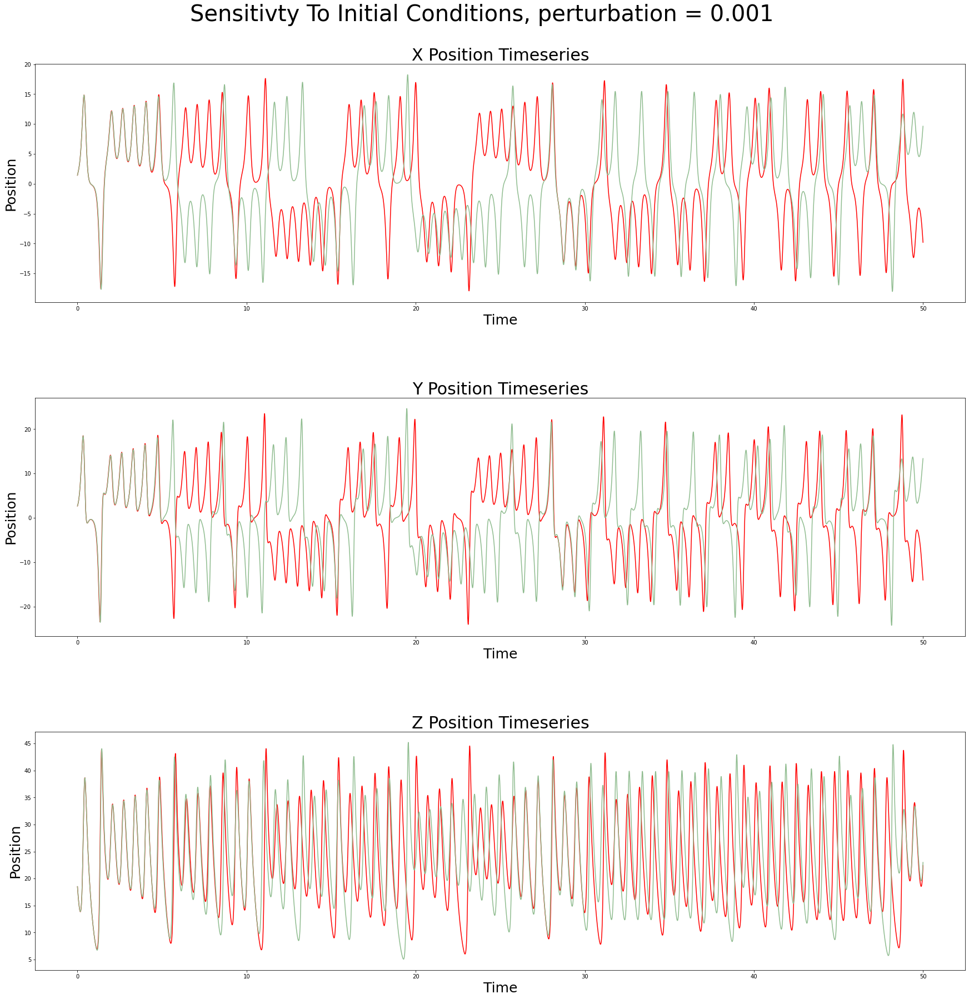

In [200]:
fig7 = plt.figure(figsize = (30,30))

fig7.subplots_adjust(hspace=0.4)

fig7.suptitle("Sensitivty To Initial Conditions, perturbation = 0.001 ", fontsize=40, y=0.93)

ax2 = fig7.add_subplot(3,1,1)
ax2.plot(t_u,x_u,color="red")
ax2.plot(t_n,x_n,color="darkseagreen")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"X Position Timeseries", fontsize = 30)

ax2 = fig7.add_subplot(3,1,2)
ax2.plot(t_u,y_u,color="red")
ax2.plot(t_n,y_n,color="darkseagreen")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"Y Position Timeseries", fontsize = 30)

ax2 = fig7.add_subplot(3,1,3)
ax2.plot(t_u,z_u,color="red")
ax2.plot(t_n,z_n,color="darkseagreen")
ax2.set_xlabel("Time", fontsize = 25)
ax2.set_ylabel("Position", fontsize = 25)
ax2.set_title(f"Z Position Timeseries", fontsize = 30)

In [86]:
def jacobian_lorenz(state):
    """Compute the Jacobian matrix of the Lorenz system."""
    x, y, z = state
    return np.array([
        [-sigma, sigma, 0],
        [rho - z, -1, -x],
        [y, x, -beta]])

In [87]:
#New Method
t_span = [0, 50]
t_eval = np.linspace(0, 50, 10000)  

initial_state = np.array([1.4324, 2.6837, 18.5043])
solution = solve_ivp(lorenz, t_span, initial_state, t_eval=t_eval, args=(sigma, beta, rho), method="RK45")
X_1 = solution.y.T  # Unperturbed trajectory

dim = len(initial_state)
num_steps = len(t_eval)
E = np.eye(dim) # Initial orthonormal basis
I = np.eye(dim) # Identity matrix
lyapunov_exponents_sum = np.zeros(dim)              #Running sum of exponents
lyapunov_exponents     = np.zeros((num_steps, dim)) #Stroage

# Evolve basis vectors alongside the trajectory
for i in tqdm(range(1, num_steps), total=num_steps, desc="Iterating Through Trajectory"):
    
    state = X_1[i]
    J = jacobian_lorenz(state)
    A = I + (J * dt)        # State transition matrix
    
    V    = np.dot(A, E)     # Evolve basis vectors
    Q, R = np.linalg.qr(V)  # Orthonormalization
    
    lyapunov_exponents_sum += np.log(np.abs(np.diag(R)))         # Accumulate log-stretching factors
    lyapunov_exponents[i]   = lyapunov_exponents_sum / (i * dt)  # Compute time-averaged exponents

    E = Q  # Update basis

Iterating Through Trajectory: 100%|█████████▉| 9999/10000 [00:00<00:00, 14872.87it/s]


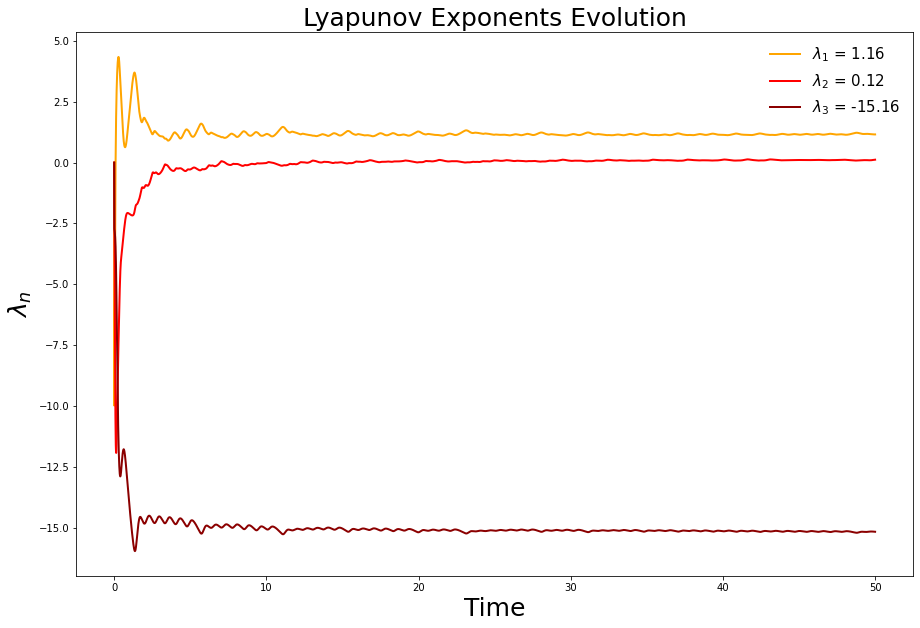

In [93]:
Final_exponents = lyapunov_exponents[-1]

fig_LE = plt.figure(figsize = (15,10))
ax    = fig_LE.add_subplot(1,1,1)

ax.plot(t_eval, lyapunov_exponents[:, 0], label="$\\lambda_{1}$ = 1.16"   , linewidth=2 ,color='orange')
ax.plot(t_eval, lyapunov_exponents[:, 1], label="$\\lambda_{2}$ = 0.12"   , linewidth=2 ,color='red')
ax.plot(t_eval, lyapunov_exponents[:, 2], label="$\\lambda_{3}$ = -15.16" , linewidth=2 ,color='darkred')
    
ax.set_xlabel("Time", fontsize = 25)
ax.set_ylabel("$\\lambda_{n}$", fontsize = 25)
ax.set_title("Lyapunov Exponents Evolution", fontsize = 25)
ax.legend(fontsize=15, frameon=False)

In [94]:
save_path = os.path.abspath(os.path.join(save_dir, "Lyapunov_Exponents.png"))
fig_LE.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

1. **Largest Exponent, $\lambda_{1} > 0$, indicates Sensitivity to initial conditions (chaos).** It quantifies how quickly nearby trajectories diverge over time, meaning small perturbations grow exponentially. This explains why the Lorenz system exhibits butterfly-effect-like behavior, where small initial differences lead to vastly different outcomes.

<br>

2. **Middle Exponent, $\lambda_{1} \sim 0$, references the fractal structure of Lorenz.** A near-zero exponent means that perturbations in this direction neither grow nor shrink significantly. This typically corresponds to motion along the strange attractor of the Lorenz system. The presence of a zero exponent is common in dynamical systems because it reflects the flow along trajectories (i.e., small shifts along the attractor remain on the attractor).

<br>

3. **Smalles Exponent, $\lambda_{1} \leqslant 0$, indicates dissipation(contraction to an attractor).** Perturbations in this direction rapidly shrink. This describes the system's dissipative nature, meaning that volume in phase space contracts over time. It ensures that trajectories don’t escape to infinity but instead get "squeezed" onto a lower-dimensional attractor.

$$ h\le \sum_{i}^{}\lambda_{i}^{+} $$

In [217]:
Lyapunov_sum = []
for idx, i in enumerate(lyapunov_exponents):
    total = 0
    for exp in i:
        if exp > 0:
            total += exp
    
    #check code works
    if idx == 2000:
        print(f"The exponents at timestep 9 is: {i}")
        print(f"The sum at timestep 9 is: {total}")
    
    Lyapunov_sum.append(total)

The exponents at timestep 9 is: [  1.36414099   0.32046004 -15.87630584]
The sum at timestep 9 is: 1.6846010236469664


# 6. Embedding

In [165]:
def takens(data, m, tau):
    emb = np.array([data[0:len(data) - tau*m]])
    for i in range(1, m):
        emb = np.append(emb, [data[i*tau:len(data) - tau*(m-i)]], axis=0)
        
    return emb.T

In [169]:
from sklearn.feature_selection import mutual_info_regression

def calc_smi_min(x, n_tau):
    smi = np.zeros(n_tau)
    smi[0] = mutual_info_regression(x[:,np.newaxis],x[:])[0]
    
    # Loop through different time delays from 1 to n_tau - 1
    for i in range(1,n_tau):
        smi[i] = mutual_info_regression(x[i:,np.newaxis],x[:-i])[0]
        
    ind_smi_min = np.where(np.diff(smi)>=0)[0][0]
    return [smi, ind_smi_min]

In [170]:
n_tau=70
smi, best_tau = calc_smi_min(x_u, n_tau)  
print(f"Optimal time delay: {best_tau}")

Optimal time delay: 32


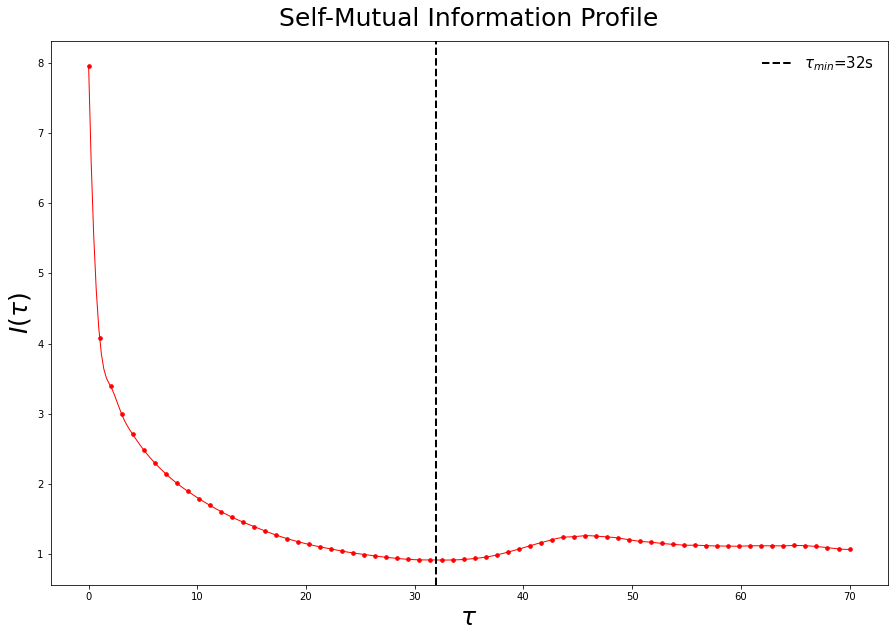

In [178]:
from scipy.interpolate import CubicSpline

tau_vals = np.linspace(0,n_tau,len(smi))
tau_smooth = np.linspace(min(tau_vals), max(tau_vals), 300)
spline = CubicSpline(tau_vals, smi)
smi_smooth = spline(tau_smooth)

fig_tau = plt.figure(figsize = (15,10))
ax2     = fig_tau.add_subplot(1,1,1)
ax2.scatter(tau_vals, smi, color='red',s=13)
ax2.plot(tau_smooth,smi_smooth, color='red',linewidth=1)
ax2.axvline(x=best_tau, color='black', linestyle='--', label="$\\tau_{min}$=32s",linewidth=2)
ax2.set_xlabel("$\\tau$", fontsize = 25)
ax2.set_ylabel("$I(\\tau)$", fontsize = 25)
ax2.set_title(f"Self-Mutual Information Profile", fontsize = 25, pad = 15)
ax2.legend(fontsize=15,frameon=False)

In [179]:
save_path = os.path.abspath(os.path.join(save_dir, "SMI_Profile.png"))
fig_tau.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [212]:
from scipy.spatial import distance
from scipy.spatial import distance_matrix
from statsmodels.tsa.stattools import acf

def calc_min_m(x, tau, mtilde_max, w):

    E_mtilde = np.zeros([mtilde_max,])
    Estar_mtilde = np.zeros([mtilde_max,])
    for mtilde in tqdm(range(1,mtilde_max+1)):
        Zeta_mtilde = takens(x, tau, mtilde)
        Zeta_mtilde1 = takens(x, tau, mtilde+1)

        n_samples_embed_mtilde = np.shape(Zeta_mtilde)[1]
        n_samples_embed_mtilde1 = np.shape(Zeta_mtilde1)[1]
        d = distance_matrix(Zeta_mtilde.T,Zeta_mtilde.T)
        d1 = distance_matrix(Zeta_mtilde1.T,Zeta_mtilde1.T)
        ind_d_sort = np.argsort(d)
        ind_nn = np.zeros([n_samples_embed_mtilde,], dtype=int)
        deltax_mtilde = []
        delta_ratio = []
        for i in range(n_samples_embed_mtilde):
            ind_nn[i] = ind_d_sort[i,np.where(ind_d_sort[i,:]>w)[0][0]]
            if ind_nn[i] < n_samples_embed_mtilde1:
                zeta_mtilde_nn = Zeta_mtilde[:,ind_nn[i]]
                zeta_mtilde1_nn = Zeta_mtilde1[:,ind_nn[i]]
                delta_mtilde_nn = d[i,ind_nn[i]]
                delta_mtilde1_nn = d1[i,ind_nn[i]]
                deltax_mtilde_nn = \
                    np.abs(x[i+mtilde*tau] - x[ind_nn[i]+mtilde*tau])
                deltax_mtilde.append(deltax_mtilde_nn)
                if delta_mtilde_nn==0 and delta_mtilde1_nn == 0:
                    delta_ratio.append(np.nan)
                else:
                    delta_ratio.append(delta_mtilde1_nn / delta_mtilde_nn)
                
        E_mtilde[mtilde-1] = np.nanmean(delta_ratio)
        Estar_mtilde[mtilde-1] = np.nanmean(deltax_mtilde)
    E1 = E_mtilde[1:]/E_mtilde[:-1]
    E2 = Estar_mtilde[1:]/Estar_mtilde[:-1]
    return [E1, E2]

In [217]:
mtilde_max = 10         
w = 30                 

E1, E2 = calc_min_m(x_u, best_tau, mtilde_max, w)

100%|██████████| 10/10 [00:01<00:00,  5.48it/s]


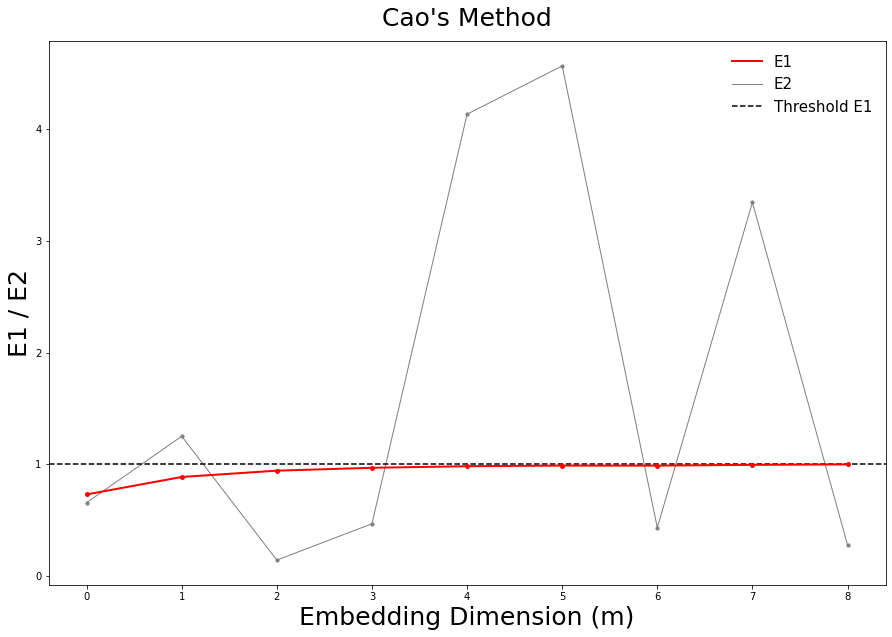

In [222]:
fig_cao = plt.figure(figsize = (15,10))
ax2   = fig_cao.add_subplot(1,1,1)
ax2.plot(range(0, len(E1)), E1, color='red' , label="E1" ,zorder=4, linewidth=2)
ax2.plot(range(0, len(E2)), E2, color='grey', label="E2" ,zorder=1, linewidth=1)
ax2.scatter(range(0, len(E1)), E1, color='red' ,zorder=5, s=15)
ax2.scatter(range(0, len(E2)), E2, color='grey',zorder=2, s=10)
#ax2.scatter(mval ,E1[mval-1] ,marker='o' ,s=100 ,label="Optimal m" ,color='black',zorder=10)
ax2.axhline(y=1, color='black', linestyle='--', label="Threshold E1",zorder=3)
ax2.set_xlabel("Embedding Dimension (m)", fontsize = 25)
ax2.set_ylabel("E1 / E2", fontsize = 25)
ax2.set_title(f"Cao's Method", fontsize = 25, pad = 15)
ax2.legend(fontsize=15,frameon=False)

In [223]:
save_path = os.path.abspath(os.path.join(save_dir, "Cao_Graph.png"))
fig_cao.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

## Reconstructing

In [236]:
zeta       = takens(x_u, m=4, tau=32)
#Discard Transients
zeta       = zeta[2000:]
x,y,z      = zeta[:,0],zeta[:,1],zeta[:,2]
X_r        = np.column_stack((x, y, z))
num_points = len(X_r)
t_r        = np.linspace(10,50,num_points)

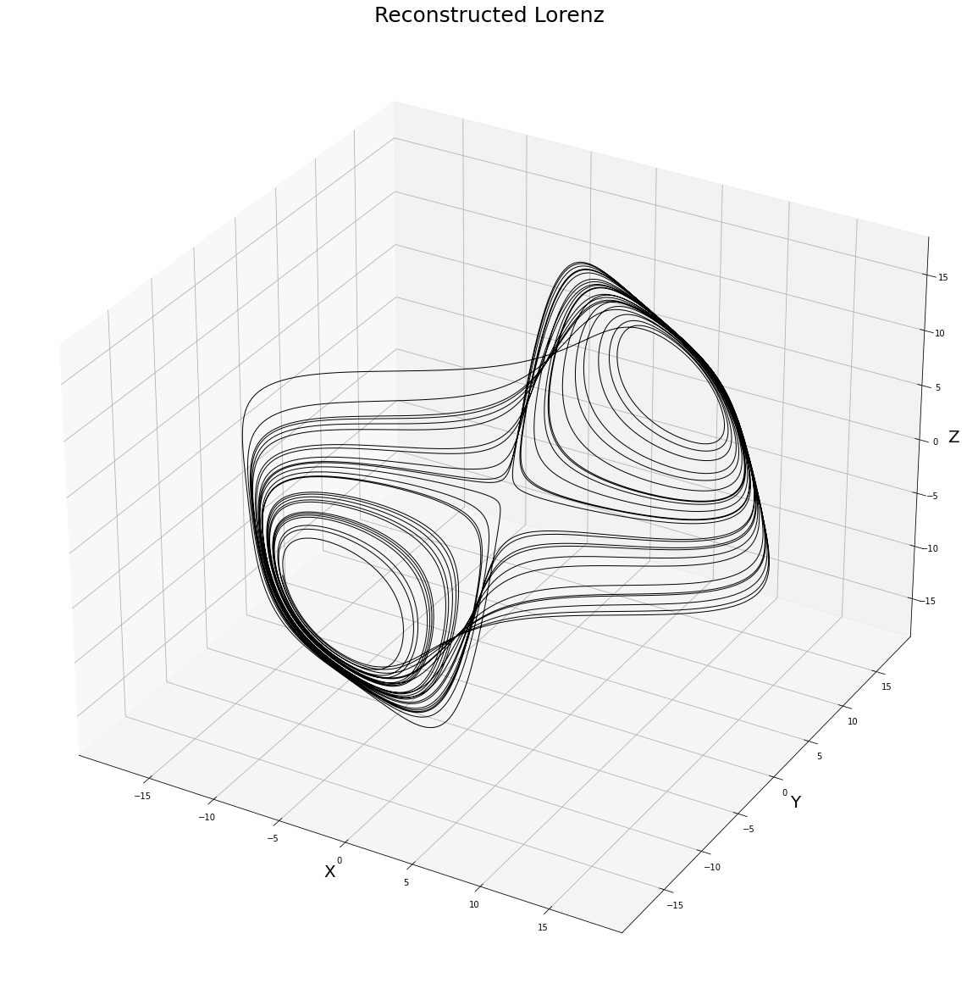

In [237]:
fig_reconstructed = plt.figure(figsize=(30, 21))
ax2               = fig_reconstructed.add_subplot(111, projection='3d')
plot              = ax2.plot(x, y, z, c='black', linewidth=1)  
#cbar             = plt.colorbar(scatter, ax=ax2, shrink=0.6, aspect=10)
#cbar.set_label("Predictability ($\\alpha_{\\eta}$)", fontsize=20)
ax2.set_title("Reconstructed Lorenz", fontsize=25)
ax2.set_xlabel("X", fontsize=20)
ax2.set_ylabel("Y", fontsize=20)
ax2.set_zlabel("Z", fontsize=20)
plt.show()

In [238]:
save_path = os.path.abspath(os.path.join(save_dir, "Lorenz_Reconstructed.png"))
fig_reconstructed.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

In [263]:
filename = "initial_state[1.4324_2.6837_18.5043]_Reconstructed"
dist, exceeds, exceeds_idx, exceeds_bool, exp_stat = li.compute_exceeds(zeta, filepath, filename ,ql , n_jobs, theiler_len)

Computing pairwise_distances using 8 threads...
Elapsed time: 1.540475845336914 seconds
Distance matrix not saved.
Number selected: 237
(7872, 7872)


In [264]:
filename = "initial_state[1.4324_2.6837_18.5043]_Reconstructed_Forecasting_Alphas"
alphas_r = compute_alphat(dist, exceeds_bool, filepath, filename, time_lag, ql, theiler_len, l=1)

100%|██████████| 5/5 [00:07<00:00,  1.51s/it]


In [265]:
alpha_distribution_2 = {}
for idx in range(len(time_lag)):
    TL_idx    = time_lag[idx]
    alpha     = alphas_r[TL_idx]
    kde       = gaussian_kde(alpha)
    pdf_vals  = kde(x_vals)
    alpha_distribution_2[idx] = pdf_vals

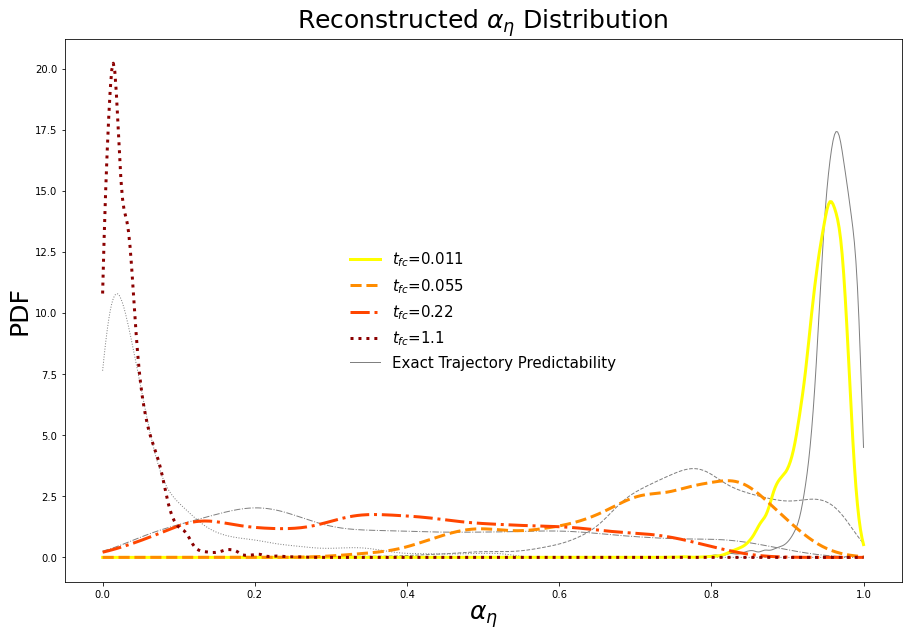

In [269]:
fig_PDE_r = plt.figure(figsize = (15,10))
ax2       = fig_PDE_r.add_subplot(1,1,1)

ax2.plot(x_vals, alpha_distribution_2[0],label="$t_{fc}$=0.011",linewidth=3,color='yellow', zorder=2)
ax2.plot(x_vals, alpha_distribution_2[1],label="$t_{fc}$=0.055",linewidth=3,color='darkorange',linestyle="--", zorder=2)
ax2.plot(x_vals, alpha_distribution_2[2],label="$t_{fc}$=0.22" ,linewidth=3,color='orangered',linestyle="-.", zorder=2)
ax2.plot(x_vals, alpha_distribution_2[3],label="$t_{fc}$=1.1"  ,linewidth=3,color='darkred',linestyle=":", zorder=2)

ax2.plot(x_vals, alpha_distribution[0],label="Exact Trajectory Predictability",linewidth=1,color='gray', zorder=1)
ax2.plot(x_vals, alpha_distribution[1],linewidth=1,color='gray',linestyle="--", zorder=1)
ax2.plot(x_vals, alpha_distribution[2],linewidth=1,color='gray',linestyle="-.", zorder=1)
ax2.plot(x_vals, alpha_distribution[3],linewidth=1,color='gray',linestyle=":", zorder=1)

ax2.set_xlabel("$\\alpha_{\\eta}$", fontsize = 25)
ax2.set_ylabel("PDF", fontsize = 25)
ax2.set_title("Reconstructed $\\alpha_{\\eta}$ Distribution", fontsize = 25)
ax2.legend(fontsize=15, frameon=False, loc='center')

In [270]:
save_path = os.path.abspath(os.path.join(save_dir, "Alpha_PDE_Reconstructed.png"))
fig_PDE_r.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

#### Entropy 

In [271]:
num_points = len(zeta)
indices    = np.random.permutation(num_points) # Generate a random permutation of indices
split_idx  = int(split_ratio * num_points)
train_indices, test_indices = indices[:split_idx], indices[split_idx:]

X_scaled = scaler.fit_transform(zeta)
train_data, test_data = X_scaled[train_indices], X_scaled[test_indices]
train_time, test_time = t_r[train_indices]     , t_r[test_indices]

#Sort data in correct order
sorted_indices = np.argsort(test_time) #test
test_time      = test_time[sorted_indices]
test_data      = test_data[sorted_indices]
sorted_indices = np.argsort(train_time) #train
train_time     = train_time[sorted_indices]
train_data     = train_data[sorted_indices]

In [277]:
tree = KDTree(train_data)

#K and adding tmes can stay the same 
#Generate new current parameters for randomness
current_times   = np.random.choice(test_time, size=200, replace=False)
current_indices = IndiceFinder(test_time,current_times)

#Redo array setup
Yarrays = []
Xarrays = []
Forecasted_vals = []
STD_DEV_VALS    = []

In [278]:
#loop time
for i, Tnow in tqdm(enumerate(current_times), total=len(current_times), desc="Forecasting"):
        
    #1. find a suitable forecast time and their corresponding indices
    if Tnow < 48.0:
        Forecast_times   = adding_times + Tnow
        Forecast_indices = IndiceFinder(test_time, Forecast_times)
        idx_Tnow = current_indices[i] 

    else:
        Tnow -= 2
        Forecast_times   = adding_times + Tnow
        Forecast_indices = IndiceFinder(test_time, Forecast_times)
        idx_Tnow = IndiceFinder(test_time,Tnow)
    
    #2. Find the Lorenz datapoint at Tnow
    Xnow = test_data[idx_Tnow]
    
    #3. Find the nearest neighbours to this point in the training set
    distances, indices = tree.query(Xnow, k=k)
    Tmax    = 48
    idx_45  = IndiceFinder(train_time,Tmax)
    mask    = indices < idx_45
    indices = indices[mask]
    
    #4. Empty arrays to store equation components
    Y                = []
    Forecasted_value = []
    STD_DEV_ERRORS   = []

    #5. Loop over each forecast time and make predictions
    for i, idx_tforecast in enumerate(Forecast_indices):
        future_trajectory = []
        difference = idx_tforecast - idx_Tnow
        if isinstance(difference, np.ndarray):
            print(f"Difference is an array not a scaler. Tnow = {Tnow}, at index {idx_Tnow}")
        for idx_next in range(1,difference+1):
            next_indices   = indices + idx_next
            NN_positions   = train_data[next_indices]
            next_position  = np.mean(NN_positions,axis=0)
            future_trajectory.append(next_position)
        
        #6. Find true trajectories, error values, and standard deviations.
        Forecast_trajectory = np.array(future_trajectory)
        Forecasted_value.append(Forecast_trajectory[-1])
        True_trajectory     = test_data[idx_Tnow:idx_Tnow + difference]
        trajectory_errors   = np.linalg.norm(True_trajectory - Forecast_trajectory, axis=1)
        Std_dev_errors      = np.std(trajectory_errors)
        STD_DEV_ERRORS.append(Std_dev_errors)
        
        #7. Find Y side of equation
        corr_x, _ = pearsonr(True_trajectory[:, 0], Forecast_trajectory[:, 0])
        corr_y, _ = pearsonr(True_trajectory[:, 1], Forecast_trajectory[:, 1])
        corr_z, _ = pearsonr(True_trajectory[:, 2], Forecast_trajectory[:, 2])
        corr_coefficient = np.mean([corr_x, corr_y, corr_z])
        Yside = np.log(1-corr_coefficient)
        Y.append(Yside)
    
    #8. append all values for access 
    Y                = np.array(Y)
    STD_DEV_ERRORS   = np.array(STD_DEV_ERRORS)
    Forecasted_value = np.array(Forecasted_value)
    
    Yarrays.append(Y)
    Xarrays.append(Forecast_times)
    STD_DEV_VALS.append(STD_DEV_ERRORS)
    Forecasted_vals.append(Forecasted_value)

Yarrays = np.array(Yarrays)
Xarrays = np.array(Xarrays)
STD_DEV_VALS    = np.array(STD_DEV_VALS)
Forecasted_vals = np.array(Forecasted_vals)

Forecasting: 100%|██████████| 200/200 [01:16<00:00,  2.60it/s]


In [279]:
entropies = []
C_vals    = []
x         = adding_times
for i in range(len(current_times)):
    y    = Yarrays[i]
    params, covariance = curve_fit(linear_model, x, y)
    m_best, c_best     = params
    h = m_best/2
    entropies.append(h)
    C_vals.append(c_best)
    
entropies       = np.array(entropies)
average_entropy = np.mean(entropies)
C_vals          = np.array(C_vals)
average_C_val   = np.mean(C_vals)

entropy is 0.5710968415917844


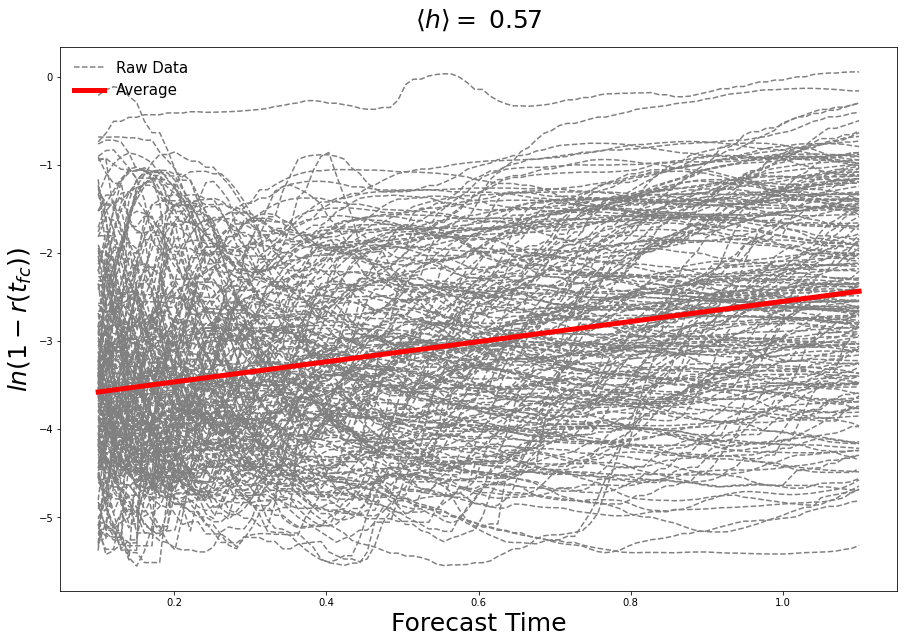

In [282]:
fig_r_ent = plt.figure(figsize = (15,10))
ax2  = fig_r_ent.add_subplot(1,1,1)
newx = adding_times
for i in range(len(current_times)):
    y = Yarrays[i]
    if i == 0:
        ax2.plot(newx, y, color='grey', label="Raw Data",linestyle="--")
    else:
        ax2.plot(newx, y, color='grey',linestyle="--")
yfit = linear_model(newx,2*average_entropy,average_C_val)
ax2.plot(newx, yfit, color='red',linewidth=5,label="Average")
ax2.set_xlabel("Forecast Time", fontsize = 25)
ax2.set_ylabel("$ln(1-r(t_{fc}))$", fontsize = 25)
ax2.set_title("$\\left\\langle h \\right\\rangle = $ 0.57", fontsize = 25, pad = 20)
ax2.legend(fontsize=15,frameon=False)
print(f"entropy is {average_entropy}")

In [283]:
save_path = os.path.abspath(os.path.join(save_dir, "Reconstructed_Entropy.png"))
fig_r_ent.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)

### Noise

In [284]:
h = []
sigvals = np.logspace(-3, -0.2, 50)  

#Looping over each simg value 
for SIG in tqdm(sigvals, total=len(sigvals), desc="Entropy Calculations at each Noise level"):
    
    Yarrays = []
    test_data_N = add_noise(test_data,SIG)

    #loop time
    for i, Tnow in enumerate(current_times):

        #1. find a suitable forecast time and their corresponding indices
        if Tnow < 48.0:
            Forecast_times   = adding_times + Tnow
            Forecast_indices = IndiceFinder(test_time, Forecast_times)
            idx_Tnow = current_indices[i] 

        else:
            Tnow -= 2
            Forecast_times   = adding_times + Tnow
            Forecast_indices = IndiceFinder(test_time, Forecast_times)
            idx_Tnow = IndiceFinder(test_time,Tnow)

        #2. Find the Lorenz datapoint at Tnow
        Xnow = test_data_N[idx_Tnow]

        #3. Find the nearest neighbours to this point in the training set
        distances, indices = tree.query(Xnow, k=k)
        Tmax    = 48
        idx_45  = IndiceFinder(train_time,Tmax)
        mask    = indices < idx_45
        indices = indices[mask]

        #4. Empty arrays to store equation components
        Y                = []

        #5. Loop over each forecast time and make predictions
        for i, idx_tforecast in enumerate(Forecast_indices):
            future_trajectory = []
            difference = idx_tforecast - idx_Tnow
            if isinstance(difference, np.ndarray):
                print(f"Difference is an array not a scaler. Tnow = {Tnow}, at index {idx_Tnow}")
            for idx_next in range(1,difference+1):
                next_indices   = indices + idx_next
                NN_positions   = train_data[next_indices]
                next_position  = np.mean(NN_positions,axis=0)
                future_trajectory.append(next_position)

            #6. Find true trajectories, error values, and standard deviations.
            Forecast_trajectory = np.array(future_trajectory)
            True_trajectory     = test_data[idx_Tnow:idx_Tnow + difference]

            # 7. Check for NaNs or Infs in the true and forecast trajectories
            if np.any(np.isnan(True_trajectory)) or np.any(np.isinf(True_trajectory)):
                print(f"Skipping Pearson calculation due to NaNs/Infs in True_trajectory at SIG = {SIG}, index {i}")
                break  # Skip this loop and continue to the next SIG value
            
            if np.any(np.isnan(Forecast_trajectory)) or np.any(np.isinf(Forecast_trajectory)):
                print(f"Skipping Pearson calculation due to NaNs/Infs in Forecast_trajectory at SIG = {SIG}, index {i}")
                break  # Skip this loop and continue to the next SIG value

            # 8. Find Y side of equation
            corr_x, _ = pearsonr(True_trajectory[:, 0], Forecast_trajectory[:, 0])
            corr_y, _ = pearsonr(True_trajectory[:, 1], Forecast_trajectory[:, 1])
            corr_z, _ = pearsonr(True_trajectory[:, 2], Forecast_trajectory[:, 2])
            corr_coefficient = np.mean([corr_x, corr_y, corr_z])
            Yside = np.log(1 - corr_coefficient)
            Y.append(Yside)
            
        # If there was a break due to NaNs/Infs, continue to the next SIG value
        if np.any(np.isnan(True_trajectory)) or np.any(np.isinf(True_trajectory)) or np.any(np.isnan(Forecast_trajectory)) or np.any(np.isinf(Forecast_trajectory)):
            continue  # Skip the rest of the current SIG value and proceed with the next SIG value

        #8. append all values for access 
        Y = np.array(Y)
        Yarrays.append(Y)

    Yarrays = np.array(Yarrays)
    entropies = []
    for i in range(len(Yarrays)):
        y    = Yarrays[i]
        params, covariance = curve_fit(linear_model, adding_times, y)
        m_best, c_best     = params
        ent = m_best/2
        entropies.append(ent)

    entropies       = np.array(entropies)
    average_entropy = np.mean(entropies)
    h.append(average_entropy)
    
h = np.array(h)

Entropy Calculations at each Noise level: 100%|██████████| 50/50 [1:04:17<00:00, 77.15s/it]


Text(0.5, 1.0, "Effect of Noise on Reconstructed Lorenz'63 Entropy")

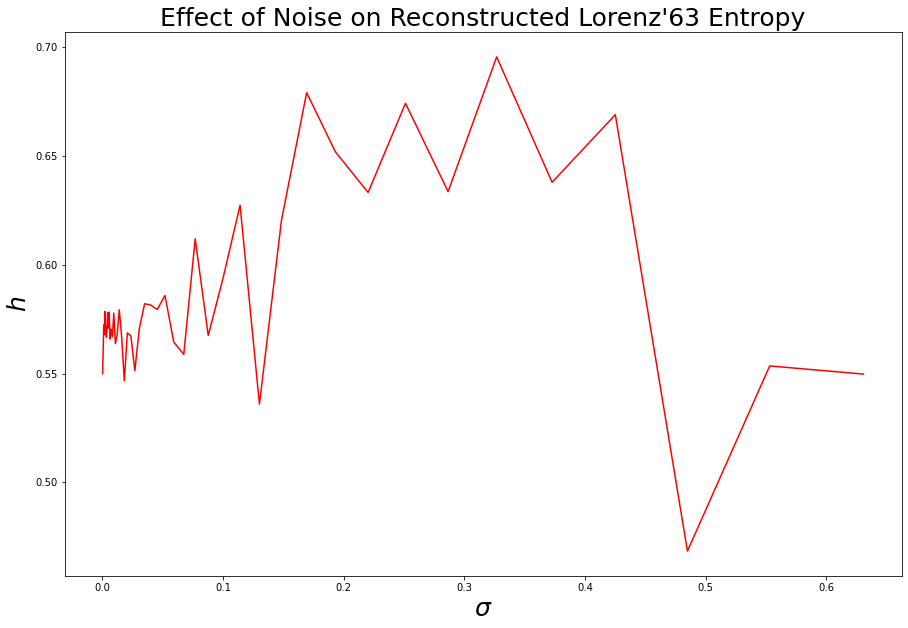

In [285]:
x = sigvals
y = h
x = np.insert(x, 0, 0.0001)
y = np.insert(y, 0, 0.55)

#num_bins = 15  # Adjust as needed
#bin_means, bin_edges, _ = stats.binned_statistic(x, y, statistic='mean', bins=num_bins)
#valid = np.isfinite(bin_means)
#bin_means = bin_means[valid]
#bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
#bin_centers = bin_centers[valid]
#spline = CubicSpline(bin_centers, bin_means)
#newx = np.linspace(min(x),max(x),10000)
#newy = spline(newx)

figerror_r = plt.figure(figsize = (15,10))
ax2        = figerror_r.add_subplot(1,1,1)
ax2.plot(x, y, color='red')
#ax2.plot(newx, newy, color='red',label='Fit')
#ax2.set_xscale('log')
ax2.set_xlabel("$\\sigma$", fontsize = 25)
ax2.set_ylabel("$h$", fontsize = 25)
ax2.set_title(f"Effect of Noise on Reconstructed Lorenz'63 Entropy", fontsize = 25)
#ax2.legend(fontsize=15, frameon=False)

In [286]:
save_path = os.path.abspath(os.path.join(save_dir, "Reconstructed_Entropy_Noise.png"))
figerror_r.savefig(save_path, dpi=300, bbox_inches='tight', transparent=True)